### FRIENDSHIPS

In [1]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
import os
import seaborn
from scipy.optimize import curve_fit
import time
from networkx.algorithms.community import girvan_newman
import matplotlib.cm as cm
import networkx.algorithms.community as nx_comm
from sklearn.cluster import spectral_clustering

In [24]:
friendship_1 = pd.read_csv("friendship_data_club1.csv", header=0, index_col=0)
friendship_1.columns = range(1, len(friendship_1.columns) + 1)

friendship_2 = pd.read_csv("friendship_data_club2.csv", header=0, index_col=0)
friendship_2.columns = range(1, len(friendship_2.columns) + 1)

friendship_3 = pd.read_csv("friendship_data_club3.csv", header=0, index_col=0)
friendship_3.columns = range(1, len(friendship_3.columns) + 1)

friendship_4 = pd.read_csv("friendship_data_club4.csv", header=0, index_col=0)
friendship_4.columns = range(1, len(friendship_4.columns) + 1)

friendship_5 = pd.read_csv("friendship_data_club5.csv", header=0, index_col=0)
friendship_5.columns = range(1, len(friendship_5.columns) + 1)


IndexError: list index out of range

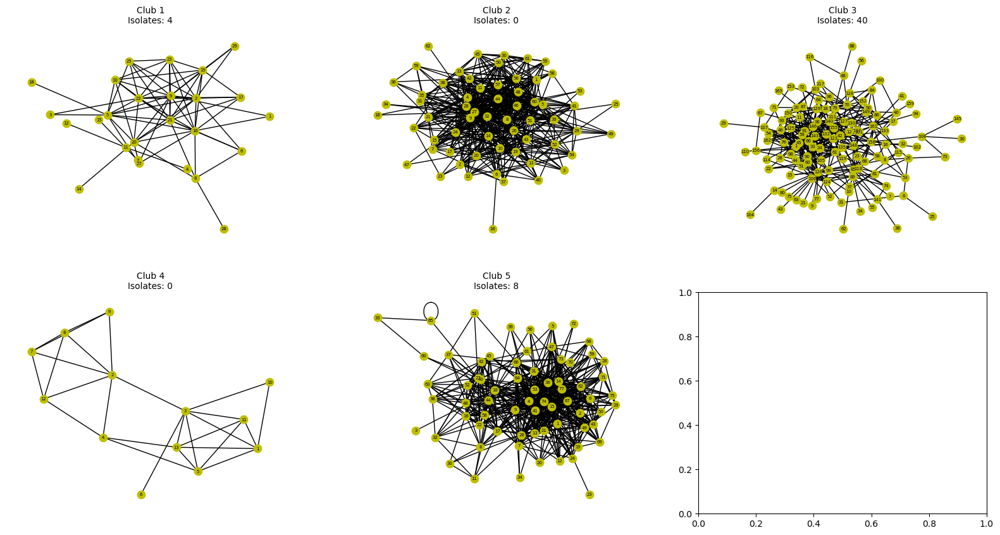

In [25]:
G1 = nx.from_pandas_adjacency(friendship_1)

G2 = nx.from_pandas_adjacency(friendship_2)

G3 = nx.from_pandas_adjacency(friendship_3)

G4 = nx.from_pandas_adjacency(friendship_4)

G5 = nx.from_pandas_adjacency(friendship_5)


isolates_G1 = list(nx.isolates(G1))
isolates_G2 = list(nx.isolates(G2))
isolates_G3 = list(nx.isolates(G3))
isolates_G4 = list(nx.isolates(G4))
isolates_G5 = list(nx.isolates(G5))

G1.remove_nodes_from(isolates_G1)
G2.remove_nodes_from(isolates_G2)
G3.remove_nodes_from(isolates_G3)
G4.remove_nodes_from(isolates_G4)
G5.remove_nodes_from(isolates_G5)

all_isolates = [isolates_G1, isolates_G2, isolates_G3, isolates_G4, isolates_G5]

fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(20, 10))

graphs = [G1, G2, G3, G4, G5]

for i, ax in enumerate(axes.flatten()):
    pos = nx.layout.kamada_kawai_layout(graphs[i])
    nx.draw(graphs[i], pos, with_labels=True, node_size=80, font_size=5, font_color='black', node_color='y', ax=ax)
    
    ax.text(0.5, 1.05, f'Club {i+1}\nIsolates: {len(all_isolates[i])}', transform=ax.transAxes, ha='center', va='center')

# Ρύθμιση των διαστάσεων των subplots
#plt.tight_layout()

# Εμφάνιση του figure
#plt.show()



Average Degree for Club 1: 4.933333333333334
Average Degree for Club 2: 17.677419354838708
Average Degree for Club 3: 5.090909090909091
Average Degree for Club 4: 4.153846153846154
Average Degree for Club 5: 14.38961038961039


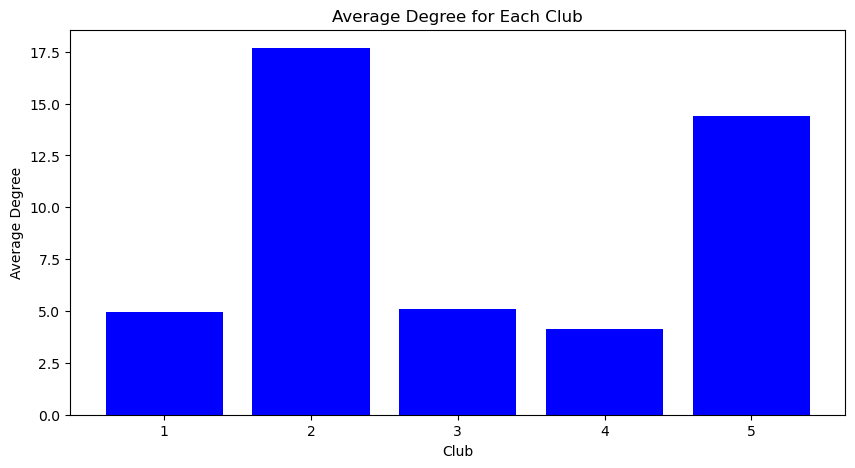

In [11]:

G1 = nx.from_pandas_adjacency(friendship_1)

G2 = nx.from_pandas_adjacency(friendship_2)

G3 = nx.from_pandas_adjacency(friendship_3)

G4 = nx.from_pandas_adjacency(friendship_4)

G5 = nx.from_pandas_adjacency(friendship_5)
average_degrees = []

for i, G in enumerate([G1, G2, G3, G4, G5]):
    avg_degree = sum(dict(G.degree()).values()) / len(G.nodes)
    average_degrees.append(avg_degree)
    print(f'Average Degree for Club {i+1}: {avg_degree}')

plt.figure(figsize=(10, 5))
plt.bar(range(1, 6), average_degrees, color='blue')
plt.xlabel('Club')
plt.ylabel('Average Degree')
plt.title('Average Degree for Each Club')
plt.show()


### KUDOS

In [26]:
kudo_1 = pd.read_csv("kudo_data_club1.csv", header=0, index_col=0, na_values=['NaN', 'nan'])
kudo_1.fillna(0, inplace=True)
kudo_1.columns = range(1, len(kudo_1.columns) + 1)

kudo_2 = pd.read_csv("kudo_data_club2.csv", header=0, index_col=0, na_values=['NaN', 'nan'])
kudo_2.fillna(0, inplace=True)
kudo_2.columns = range(1, len(kudo_2.columns) + 1)

kudo_3= pd.read_csv("kudo_data_club3.csv", header=0, index_col=0, na_values=['NaN', 'nan'])
kudo_3.fillna(0, inplace=True)
kudo_3.columns = range(1, len(kudo_3.columns) + 1)

kudo_4 = pd.read_csv("kudo_data_club4.csv", header=0, index_col=0, na_values=['NaN', 'nan'])
kudo_4.fillna(0, inplace=True)
kudo_4.columns = range(1, len(kudo_4.columns) + 1)

kudo_5 = pd.read_csv("kudo_data_club5.csv", header=0, index_col=0, na_values=['NaN', 'nan'])
kudo_5.fillna(0, inplace=True)
kudo_5.columns = range(1, len(kudo_5.columns) + 1)

In [27]:
#kudo_list = [kudo_1, kudo_2, kudo_3, kudo_4, kudo_5]

#for j, kudo in enumerate(kudo_list, start=1):
#    reshaped_data = np.array_split(kudo, 12, axis=1)

#    for i, matrix in enumerate(reshaped_data, start=1):
#        filename = f'c{j}_kudo{i}.csv'
#        np.savetxt(filename, matrix, delimiter=',', fmt='%f')


In [2]:
folder_path = 'C:/Users/Katerina/Desktop/thesis/kudo_notnull/' #'C:/Users/Katerina/Desktop/thesis/kudos/'

for j in range (1,6):
    avg_degrees = []
    short_path = []
    for i in range(1, 13):
        file_path = os.path.join(folder_path, f'c{j}_kudo{i}.csv')
        
        df = pd.read_csv(file_path, header=None)
        
        # Αφαίρεση κόμβων με NaN values
        df = df.dropna(axis=0, how='all')
        df = df.dropna(axis=1, how='all')
        
        G = nx.from_pandas_adjacency(df)
        
        avg_degree = sum(dict(G.degree()).values()) / len(G)
        avg_degrees.append(avg_degree)

        shortest_path = nx.shortest_path(G)
        short_path.append(shortest_path)

# Υπολογισμός μέσου όρου
    avg = sum(avg_degrees) / 12
    shortest = sum(shortest_path)/12
    clustering = nx.average_clustering(G)
    print(f"Club {j} Average degree: {avg}, Shortest path: {shortest}, Clustering coefficient {clustering}")




Club 1 Average degree: 2.9320987654320985, Shortest path: 29.25, Clustering coefficient 0.3707712041045375
Club 2 Average degree: 13.281609195402298, Shortest path: 137.75, Clustering coefficient 0.5923583445433654
Club 3 Average degree: 2.6876310272536688, Shortest path: 1046.75, Clustering coefficient 0.14466781126500303
Club 4 Average degree: 2.3333333333333335, Shortest path: 3.0, Clustering coefficient 0.6962962962962963
Club 5 Average degree: 9.355263157894738, Shortest path: 237.5, Clustering coefficient 0.569772435623721


In [14]:
for j in range(1, 6):
    print(f'Club {j}')
    threshold = 0.95  

    for i in range(1, 13):
        file_path = os.path.join(folder_path, f'c{j}_kudo{i}.csv')

        df = pd.read_csv(file_path, header=None)
        G = nx.from_pandas_adjacency(df)
        isolates = list(nx.isolates(G))
        G.remove_nodes_from(isolates)

        clustering_coefficients = nx.clustering(G)


        high_clustering_nodes = [node for node, cc in clustering_coefficients.items() if cc > threshold]

        print(f'Month {i} - High Clustering Nodes: {high_clustering_nodes}')

    print('-' * 30) 

Club 1
Month 1 - High Clustering Nodes: [1, 21, 23]
Month 2 - High Clustering Nodes: [1, 6, 21, 23]
Month 3 - High Clustering Nodes: [1, 21, 23]
Month 4 - High Clustering Nodes: [1, 21, 23]
Month 5 - High Clustering Nodes: [1, 21, 23]
Month 6 - High Clustering Nodes: [1, 21, 23]
Month 7 - High Clustering Nodes: [1, 12, 21, 23]
Month 8 - High Clustering Nodes: [1, 21]
Month 9 - High Clustering Nodes: [23]
Month 10 - High Clustering Nodes: [23, 25]
Month 11 - High Clustering Nodes: [16, 23]
Month 12 - High Clustering Nodes: [0, 4, 16]
------------------------------
Club 2
Month 1 - High Clustering Nodes: [18, 26, 30, 31, 47, 56]
Month 2 - High Clustering Nodes: [18, 26, 30, 56]
Month 3 - High Clustering Nodes: [18, 20, 37, 48, 56]
Month 4 - High Clustering Nodes: [5, 18, 20, 30, 31, 33, 48, 54, 56]
Month 5 - High Clustering Nodes: [18, 20, 54, 56]
Month 6 - High Clustering Nodes: [18, 30]
Month 7 - High Clustering Nodes: [18, 20, 44, 54]
Month 8 - High Clustering Nodes: [18, 20, 26, 30, 

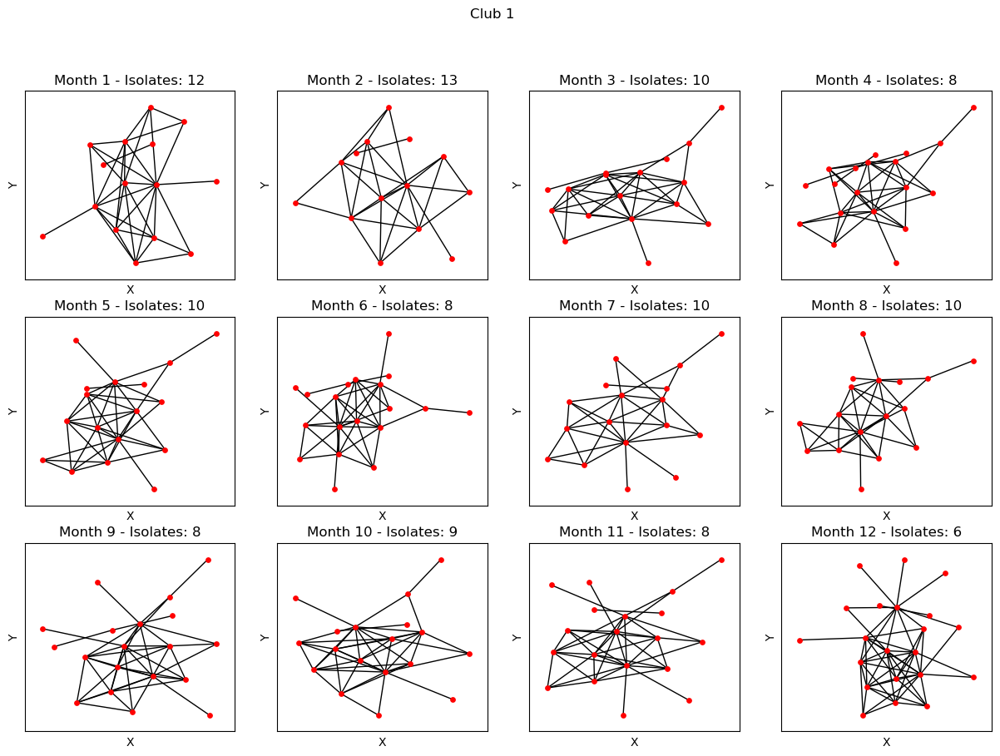

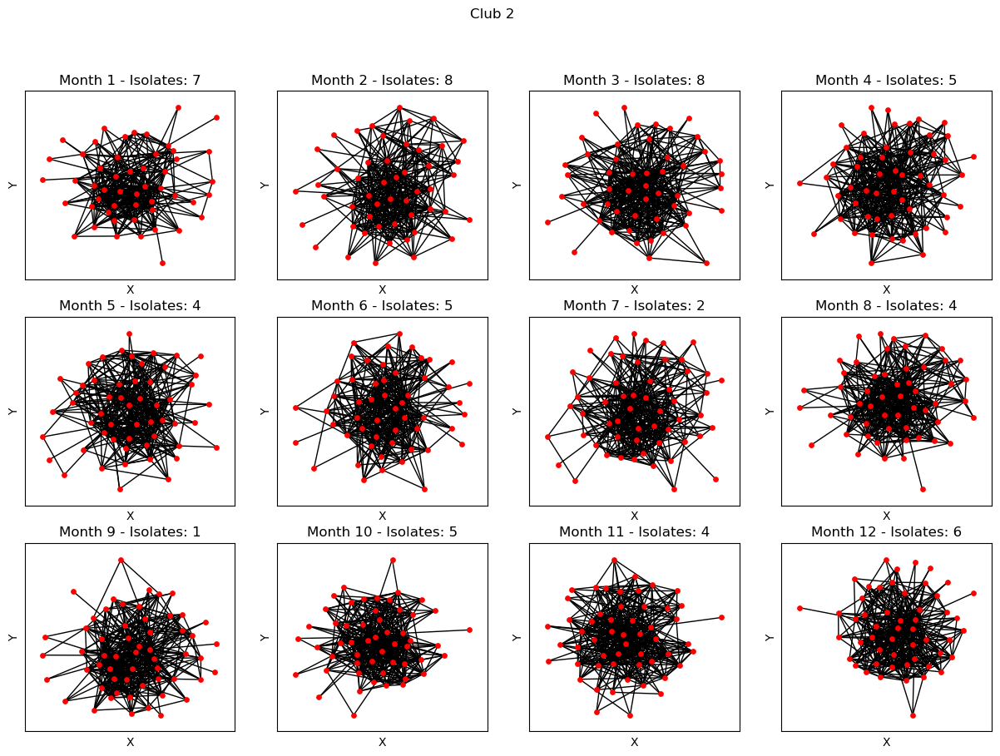

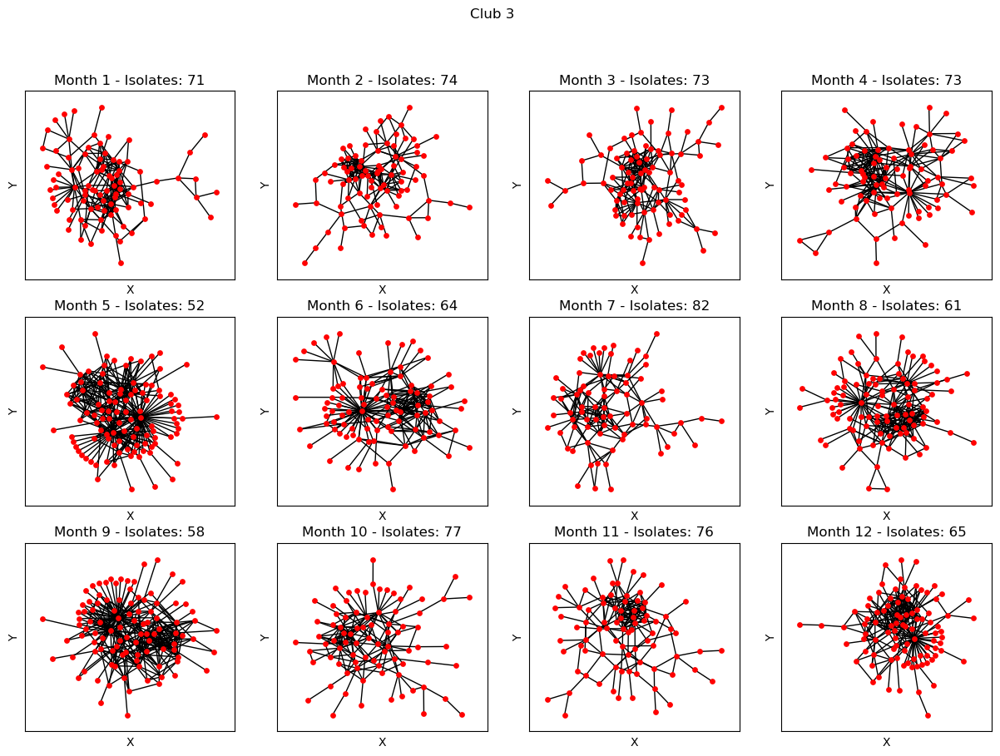

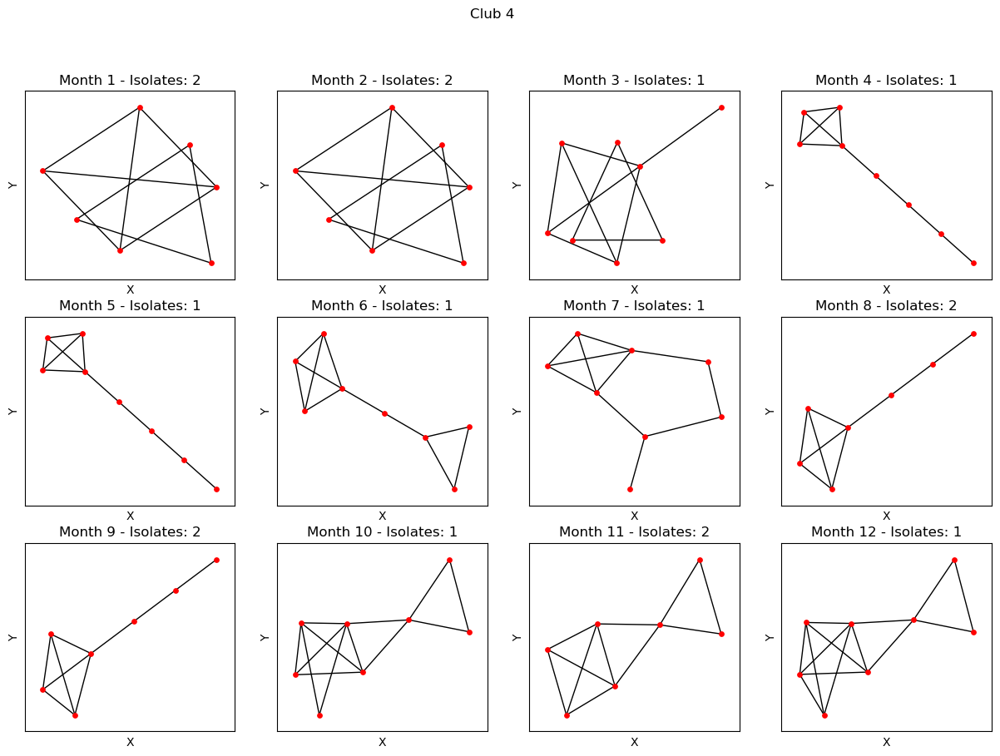

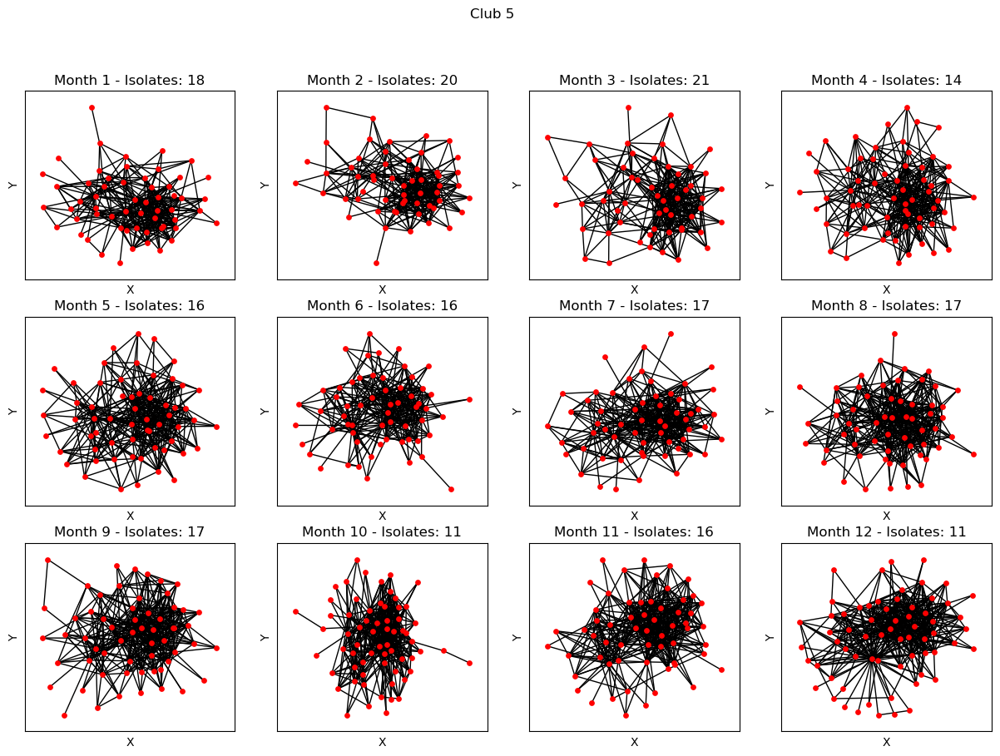

In [29]:
for j in range(1, 6):
    fig, axs = plt.subplots(3, 4, figsize=(15, 10))
    fig.suptitle(f'Club {j}')  
    for i in range(1, 13):
        file_path = os.path.join(folder_path, f'c{j}_kudo{i}.csv')

        df = pd.read_csv(file_path, header=None)
        G = nx.from_pandas_adjacency(df)

        isolates = list(nx.isolates(G))
        G.remove_nodes_from(isolates)

        avg_degree = sum(dict(G.degree()).values()) / len(G)
        avg_degrees.append(avg_degree)
    
        ax = axs[(i-1)//4, (i-1)%4]
        

        pos = nx.layout.kamada_kawai_layout(G)  #sping_layout, circular, shell)

        nx.draw_networkx(G, pos, ax=ax, with_labels=False, node_size=15, node_color='r')
        

        ax.set_title(f'Month {i} - Isolates: {len(isolates)}')

    for ax in axs.flat:
        ax.set(xlabel='X', ylabel='Y')

    plt.show()


c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\scipy\optimize\_minpack_py.py:486: RuntimeWarning: overflow encountered in matmul
  cov_x = invR @ invR.T
c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\scipy\optimize\_minpack_py.py:486: RuntimeWarning: overflow encountered in matmul
  cov_x = invR @ invR.T
c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\scipy\optimize\_minpack_py.py:486: RuntimeWarning: overflow encountered in matmul
  cov_x = invR @ invR.T
c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\scipy\optimize\_minpack_py.py:486: RuntimeWarning: overflow encountered in matmul
  cov_x = invR @ invR.T
c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\scipy\optimize\_minpack_py.py:486: RuntimeWarning: overflow encountered in matmul
  cov_x = invR @ invR.T
c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\scipy\optimize\_minpack_py.py:486: RuntimeWarning: overflow encounte

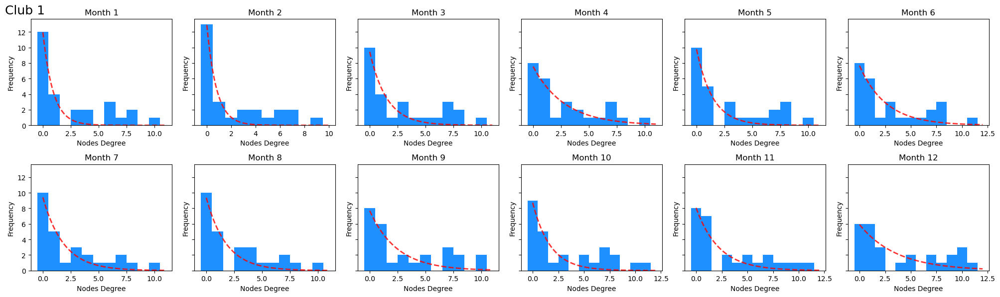

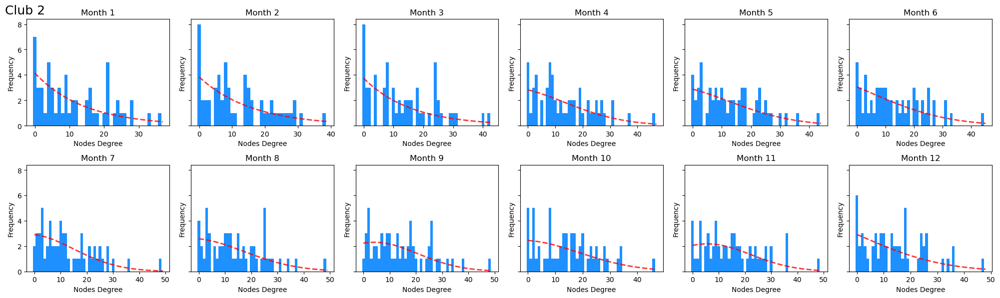

c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\scipy\optimize\_minpack_py.py:486: RuntimeWarning: overflow encountered in matmul
  cov_x = invR @ invR.T
c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\scipy\optimize\_minpack_py.py:486: RuntimeWarning: overflow encountered in matmul
  cov_x = invR @ invR.T
c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\scipy\optimize\_minpack_py.py:486: RuntimeWarning: overflow encountered in matmul
  cov_x = invR @ invR.T
c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\scipy\optimize\_minpack_py.py:486: RuntimeWarning: overflow encountered in matmul
  cov_x = invR @ invR.T
c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\scipy\optimize\_minpack_py.py:486: RuntimeWarning: overflow encountered in matmul
  cov_x = invR @ invR.T
c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\scipy\optimize\_minpack_py.py:486: RuntimeWarning: overflow encounte

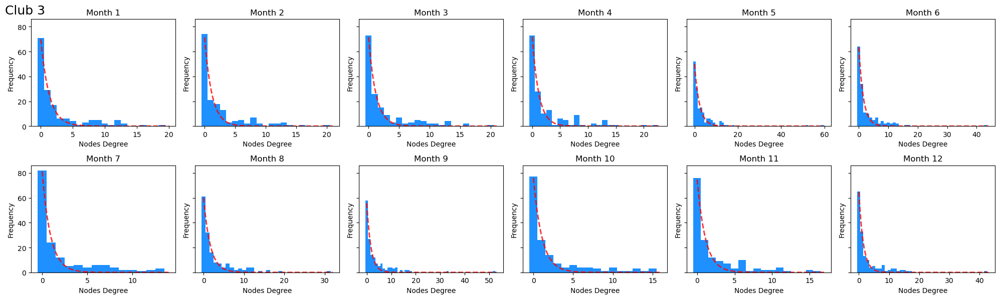

c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\scipy\optimize\_minpack_py.py:906: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\scipy\optimize\_minpack_py.py:906: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\scipy\optimize\_minpack_py.py:486: RuntimeWarning: overflow encountered in matmul
  cov_x = invR @ invR.T
c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\scipy\optimize\_minpack_py.py:486: RuntimeWarning: overflow encountered in matmul
  cov_x = invR @ invR.T


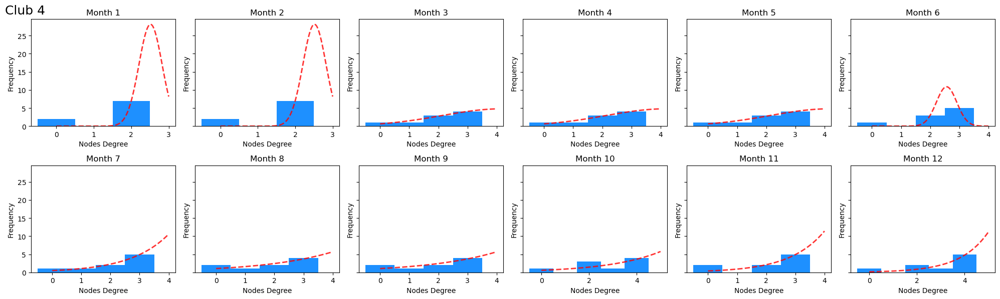

c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\scipy\optimize\_minpack_py.py:486: RuntimeWarning: overflow encountered in matmul
  cov_x = invR @ invR.T
c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\scipy\optimize\_minpack_py.py:486: RuntimeWarning: overflow encountered in matmul
  cov_x = invR @ invR.T


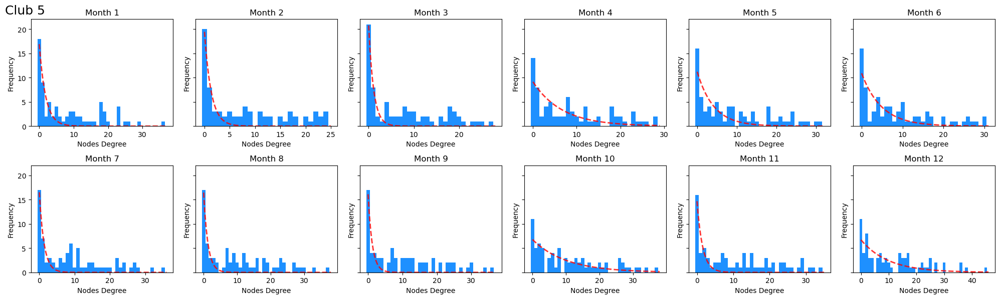

In [30]:
def gaussian(x, mu, sigma, A):
    return A * np.exp(-(x - mu)**2 / (2 * sigma**2))

for j in range(1, 6):
    fig, axes = plt.subplots(nrows=2, ncols=6, figsize=(20, 6), sharey=True)

    for i in range(1, 13):
        file_path = os.path.join(folder_path, f'c{j}_kudo{i}.csv')

        df = pd.read_csv(file_path, header=None)
        G = nx.from_pandas_adjacency(df)

        degree_distribution = [G.degree(node) for node in G.nodes()]

        bins = range(min(degree_distribution), max(degree_distribution) + 1)
        hist, bin_edges = np.histogram(degree_distribution, bins=bins)

        p0 = [np.mean(degree_distribution), np.std(degree_distribution), max(hist)]
        params, covariance = curve_fit(gaussian, bin_edges[:-1], hist, p0=p0, maxfev=1000000)

        axes[(i-1)//6, (i-1)%6].hist(degree_distribution, bins=bins, align='left', color='dodgerblue')
        
        x_values = np.linspace(min(degree_distribution), max(degree_distribution), 100)
        y_values = gaussian(x_values, *params)
        axes[(i-1)//6, (i-1)%6].plot(x_values, y_values, color='r', linestyle='--', linewidth=2, label='Fit', alpha=0.8)

        axes[(i-1)//6, (i-1)%6].set_title(f'Month {i}')
        axes[(i-1)//6, (i-1)%6].set_xlabel('Nodes Degree')
        axes[(i-1)//6, (i-1)%6].set_ylabel('Frequency')

    fig.text(0.005, 0.99, f'Club {j}', ha='left', va='top', fontsize=18)

    plt.tight_layout()

    plt.show()


[frozenset({17, 18, 19, 3, 6, 23, 8}), frozenset({0, 16, 1, 20, 21, 7}), frozenset({9, 2})]
The graph c1_kudo1 has 3 communities.
The modularity of communities: 0.17795918367346933
[frozenset({0, 16, 1, 19, 20, 21, 7}), frozenset({17, 18, 3, 6, 23}), frozenset({9, 2})]
The graph c1_kudo2 has 3 communities.
The modularity of communities: 0.21166666666666667
[frozenset({0, 16, 1, 19, 20, 21, 7}), frozenset({17, 18, 3, 6, 23, 8, 24}), frozenset({9, 2, 10})]
The graph c1_kudo3 has 3 communities.
The modularity of communities: 0.21268902038132803
[frozenset({0, 16, 1, 20, 7}), frozenset({17, 19, 3, 23, 8}), frozenset({24, 18, 21, 6}), frozenset({9, 2, 10}), frozenset({13, 5})]
The graph c1_kudo4 has 5 communities.
The modularity of communities: 0.24757617728531853
[frozenset({0, 1, 7, 8, 16, 19, 20, 21}), frozenset({17, 18, 3, 6, 23, 24, 12}), frozenset({9, 2})]
The graph c1_kudo5 has 3 communities.
The modularity of communities: 0.19592373438527283
[frozenset({16, 1, 18, 19, 20, 21, 8}), f

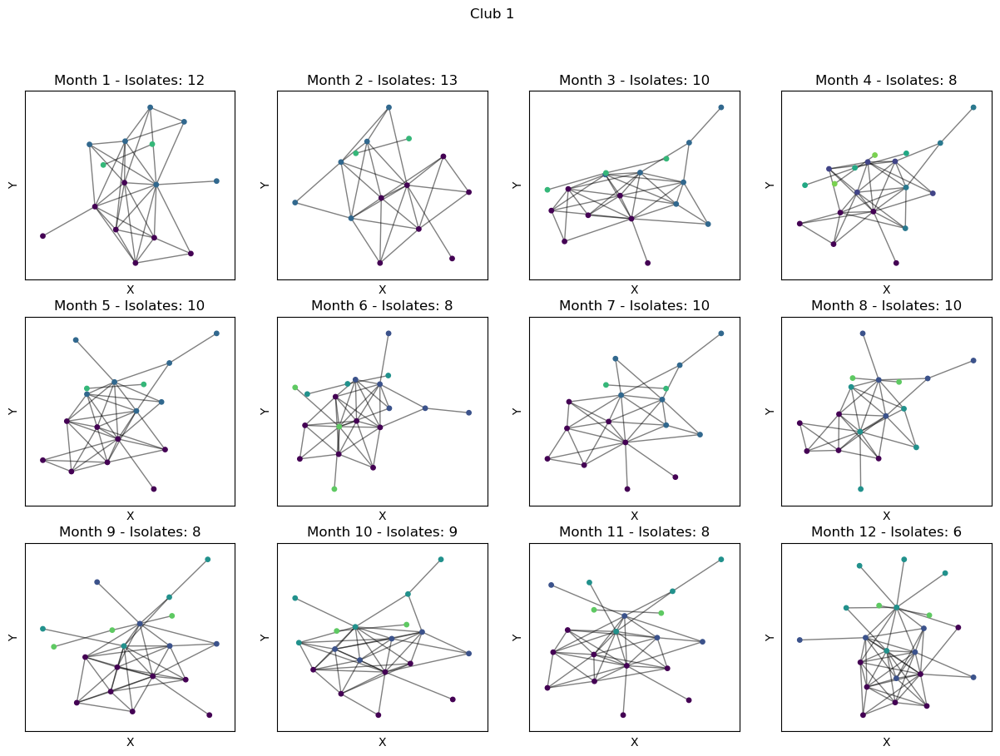

Time elapsed for Club 1: 1.3445956707000732 seconds
[frozenset({0, 3, 4, 10, 19, 21, 23, 25, 26, 27, 28, 33, 34, 37, 39, 40, 41, 43, 45, 50, 51, 52, 55, 56}), frozenset({1, 2, 6, 7, 8, 9, 11, 12, 13, 15, 16, 17, 22, 30, 31, 38, 42, 47, 48, 49, 53, 54}), frozenset({18, 20, 24, 46, 14})]
The graph c2_kudo1 has 3 communities.
The modularity of communities: 0.1672314049586777
[frozenset({0, 3, 4, 10, 14, 19, 20, 21, 23, 24, 25, 26, 27, 28, 33, 34, 37, 39, 40, 41, 43, 45, 46, 50, 51, 52, 55, 56}), frozenset({1, 2, 6, 7, 8, 9, 11, 12, 13, 15, 16, 17, 18, 22, 30, 31, 38, 42, 47, 49, 53, 54})]
The graph c2_kudo2 has 2 communities.
The modularity of communities: 0.16801092207519436
[frozenset({1, 2, 6, 8, 9, 11, 12, 13, 15, 16, 17, 18, 20, 22, 26, 29, 30, 31, 37, 38, 47, 48, 49, 54}), frozenset({0, 3, 4, 7, 10, 19, 23, 25, 27, 28, 34, 39, 40, 41, 43, 45, 46, 50, 51, 52, 53, 55, 56}), frozenset({24, 21, 14})]
The graph c2_kudo3 has 3 communities.
The modularity of communities: 0.1454711701588560

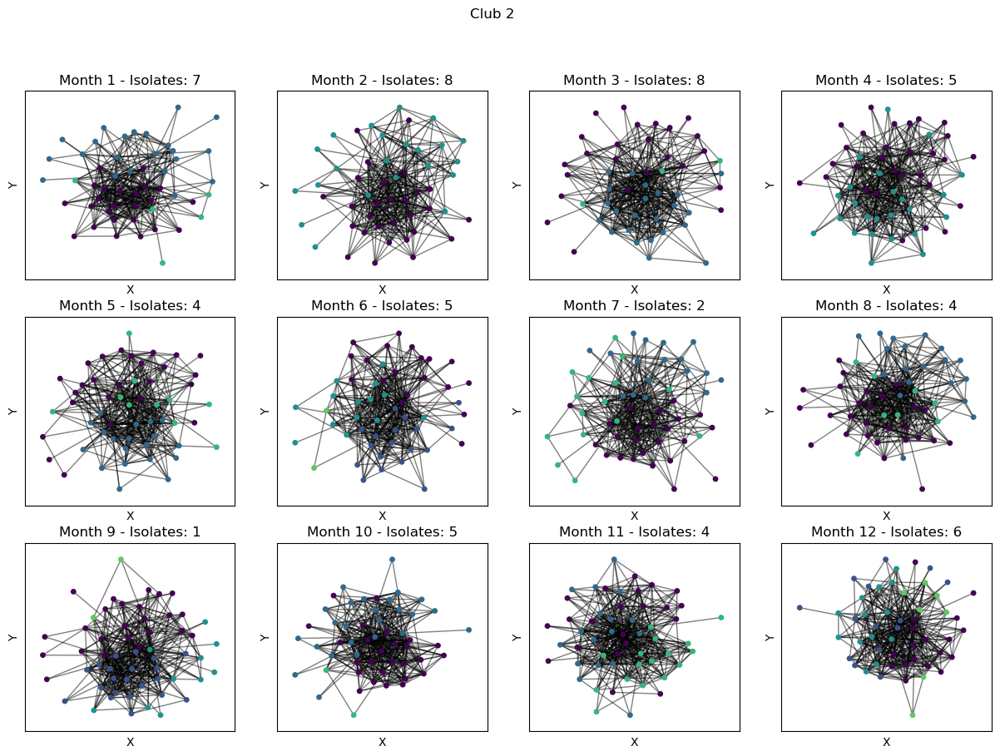

Time elapsed for Club 2: 2.2004735469818115 seconds
[frozenset({129, 66, 74, 11, 141, 15, 148, 21, 149, 23, 30, 99, 42, 112, 49, 55, 56, 121, 126}), frozenset({134, 71, 136, 10, 139, 80, 81, 84, 92, 95, 31, 34, 40, 43, 44, 117, 124, 61}), frozenset({64, 65, 3, 68, 9, 82, 83, 153, 96, 97, 108, 109, 110, 46, 113, 52, 118}), frozenset({100, 36, 37, 6, 135, 41, 79, 50, 54, 120, 157}), frozenset({5, 7, 76, 151, 24, 57, 154, 88, 29}), frozenset({143, 17, 19, 111}), frozenset({94, 38}), frozenset({28, 102}), frozenset({105, 85}), frozenset({131, 22}), frozenset({146, 101})]
The graph c3_kudo1 has 11 communities.
The modularity of communities: 0.4846679815910585
[frozenset({64, 131, 3, 6, 135, 9, 76, 79, 83, 20, 147, 22, 87, 95, 32, 36, 100, 41, 108, 50, 118, 120}), frozenset({134, 71, 136, 10, 139, 14, 17, 84, 21, 26, 92, 31, 34, 99, 40, 43, 44, 117, 119, 61}), frozenset({129, 66, 74, 11, 141, 142, 15, 148, 149, 23, 30, 57, 42, 112, 49, 55, 56, 121, 126}), frozenset({5, 7, 80, 81, 113, 151, 2

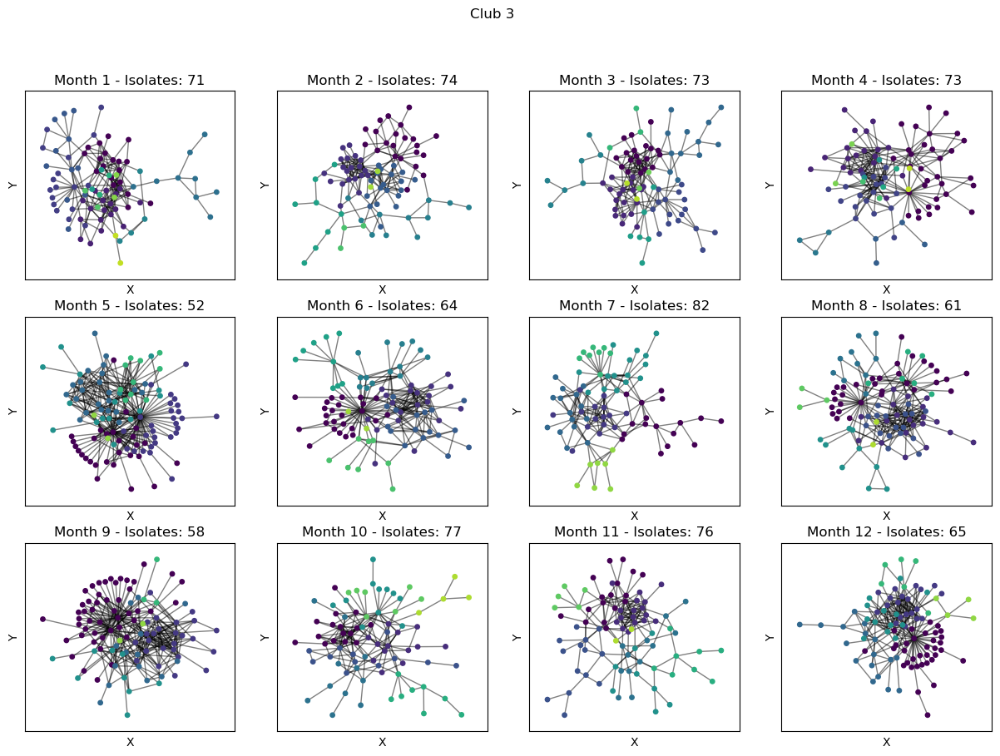

Time elapsed for Club 3: 2.847829580307007 seconds
[frozenset({0, 3, 4, 7}), frozenset({8, 2, 6})]
The graph c4_kudo1 has 2 communities.
The modularity of communities: 0.4444444444444444
[frozenset({0, 3, 4, 7}), frozenset({8, 2, 6})]
The graph c4_kudo2 has 2 communities.
The modularity of communities: 0.4444444444444444
[frozenset({0, 1, 3, 4, 7}), frozenset({8, 2, 6})]
The graph c4_kudo3 has 2 communities.
The modularity of communities: 0.41999999999999993
[frozenset({0, 3, 4, 7}), frozenset({8, 1, 2, 6})]
The graph c4_kudo4 has 2 communities.
The modularity of communities: 0.355
[frozenset({0, 3, 4, 7}), frozenset({8, 1, 2, 6})]
The graph c4_kudo5 has 2 communities.
The modularity of communities: 0.355
[frozenset({0, 1, 3, 4, 7}), frozenset({8, 2, 6})]
The graph c4_kudo6 has 2 communities.
The modularity of communities: 0.3429752066115702
[frozenset({0, 3, 4, 7}), frozenset({8, 1, 2, 6})]
The graph c4_kudo7 has 2 communities.
The modularity of communities: 0.28099173553719003
[froze

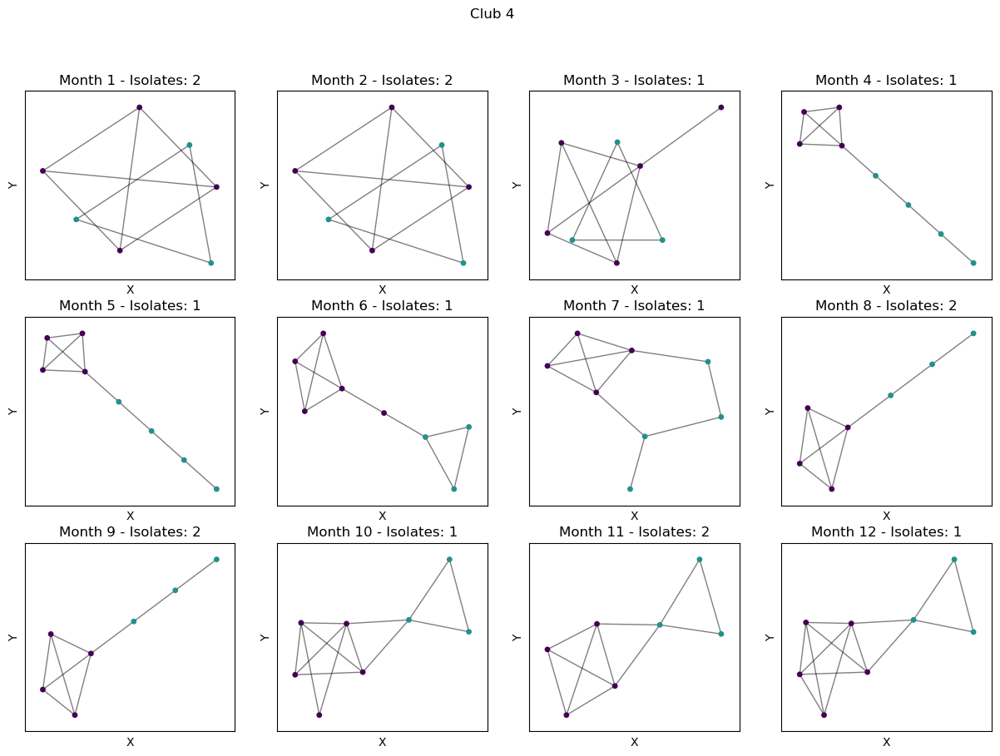

Time elapsed for Club 4: 1.2461707592010498 seconds
[frozenset({0, 65, 3, 67, 5, 6, 70, 8, 73, 11, 75, 12, 13, 14, 18, 19, 20, 26, 27, 34, 37, 39, 41, 45, 47, 48, 51, 57, 60, 62}), frozenset({64, 7, 72, 10, 74, 15, 16, 17, 21, 25, 28, 30, 32, 35, 36, 43, 46, 49, 50, 55, 56, 58, 61, 63}), frozenset({59, 38}), frozenset({1, 68})]
The graph c5_kudo1 has 4 communities.
The modularity of communities: 0.23704308491216683
[frozenset({64, 0, 65, 3, 67, 5, 6, 70, 72, 73, 11, 12, 75, 13, 14, 18, 19, 20, 26, 27, 34, 39, 41, 45, 47, 48, 49, 57, 60, 62}), frozenset({7, 8, 10, 15, 16, 17, 21, 25, 28, 30, 35, 36, 37, 43, 46, 50, 51, 56, 58, 61}), frozenset({59, 38}), frozenset({63, 31}), frozenset({1, 68})]
The graph c5_kudo2 has 5 communities.
The modularity of communities: 0.25211146254917294
[frozenset({64, 0, 65, 3, 5, 70, 6, 72, 73, 11, 12, 75, 13, 14, 18, 20, 22, 26, 34, 39, 41, 45, 47, 48, 51, 60, 62}), frozenset({7, 8, 10, 15, 16, 17, 19, 21, 25, 27, 30, 35, 36, 37, 43, 46, 49, 50, 56, 57, 58

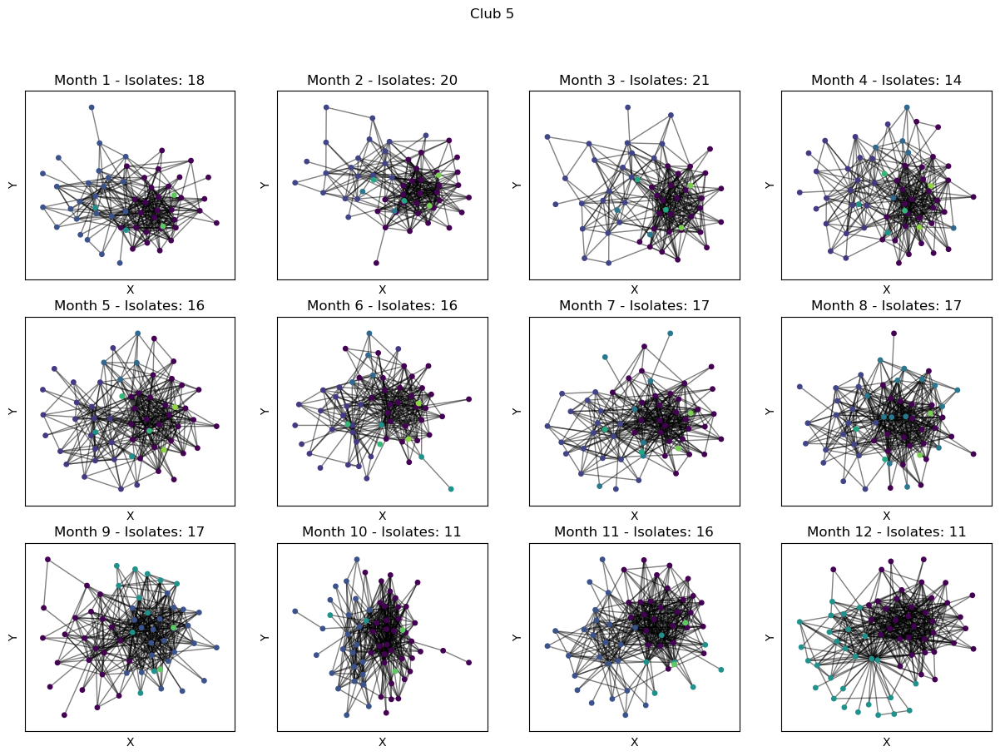

Time elapsed for Club 5: 2.2390596866607666 seconds


In [72]:
for j in range(1, 6):
    fig, axs = plt.subplots(3, 4, figsize=(15, 10))
    fig.suptitle(f'Club {j}')
    st = time.time()

    average_modularity_per_month = []

    for i in range(1, 13):
        file_path = os.path.join(folder_path, f'c{j}_kudo{i}.csv')

        df = pd.read_csv(file_path, header=None)
        G = nx.from_pandas_adjacency(df)

        isolates = list(nx.isolates(G))
        G.remove_nodes_from(isolates)

        communities = sorted(nx_comm.greedy_modularity_communities(G), key=len, reverse=True)
        print(communities)
        print(f"The graph c{j}_kudo{i} has {len(communities)} communities.")

        modularity_value = nx_comm.modularity(G, communities)
        average_modularity_per_month.append(modularity_value)
        print(f"The modularity of communities: {modularity_value}")

        et = time.time()

        ax = axs[(i-1)//4, (i-1)%4]
        pos = nx.layout.kamada_kawai_layout(G)

        for idx, community_nodes in enumerate(communities):
            color = plt.cm.viridis(idx / len(communities))  
            nx.draw_networkx_nodes(G, pos, nodelist=list(community_nodes), ax=ax, node_size=15, node_color=[color]*len(community_nodes))

        nx.draw_networkx_edges(G, pos, ax=ax, alpha=0.5)


        ax.set_title(f'Month {i} - Isolates: {len(isolates)}')

    average_modularity_overall = sum(average_modularity_per_month) / len(average_modularity_per_month)
    print(f"Average Modularity across all months for Club {j}: {average_modularity_overall}")


    for ax in axs.flat:
        ax.set(xlabel='X', ylabel='Y')

    plt.show()

    et = time.time()
    print(f"Time elapsed for Club {j}: {et - st} seconds")


The graph c1_kudo1 has 5 communities.
The modularity of communities: 0.044081632653061226
The graph c1_kudo2 has 5 communities.
The modularity of communities: 0.043888888888888984
The graph c1_kudo3 has 5 communities.
The modularity of communities: 0.12327416173570024
The graph c1_kudo4 has 6 communities.
The modularity of communities: 0.131578947368421
The graph c1_kudo5 has 5 communities.
The modularity of communities: 0.046022353714661415
The graph c1_kudo6 has 5 communities.
The modularity of communities: 0.08744794765020822
The graph c1_kudo7 has 5 communities.
The modularity of communities: 0.0990484429065743
The graph c1_kudo8 has 5 communities.
The modularity of communities: 0.09673469387755099
The graph c1_kudo9 has 5 communities.
The modularity of communities: 0.12141698215251488
The graph c1_kudo10 has 5 communities.
The modularity of communities: 0.07980371900826444
The graph c1_kudo11 has 5 communities.
The modularity of communities: 0.08139534883720927
The graph c1_kudo12

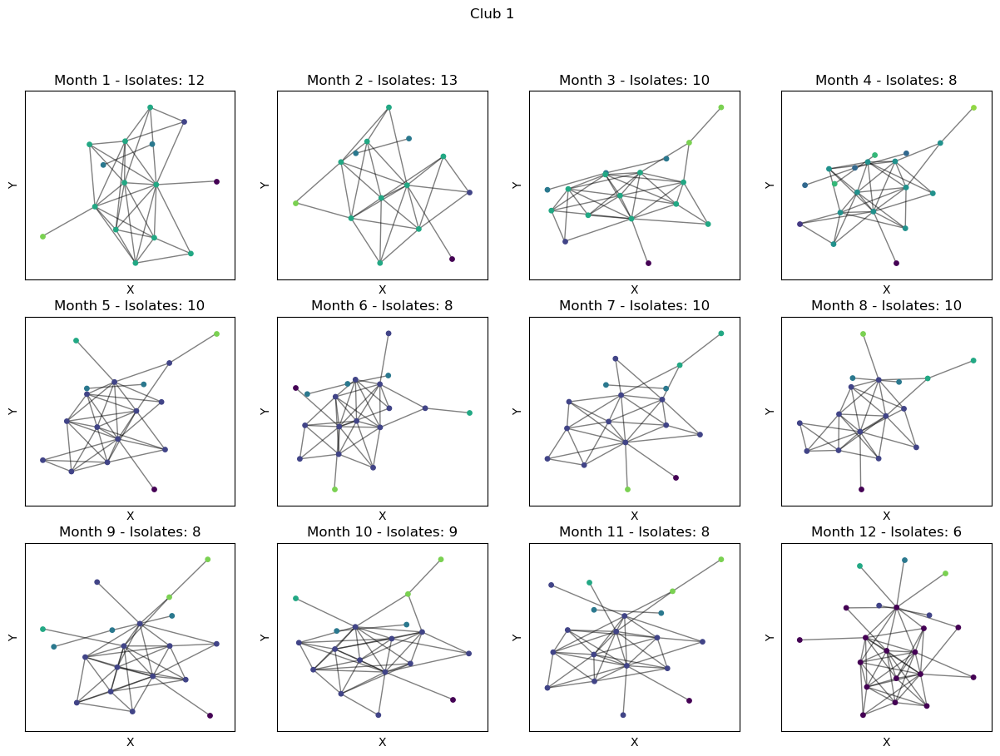

Time elapsed for Club 1: 1.553950309753418
The graph c2_kudo1 has 4 communities.
The modularity of communities: -2.7548209366412768e-05
The graph c2_kudo2 has 4 communities.
The modularity of communities: -4.620877966804943e-05
The graph c2_kudo3 has 4 communities.
The modularity of communities: -2.203274065265793e-05
The graph c2_kudo4 has 4 communities.
The modularity of communities: -5.646189818259957e-05
The graph c2_kudo5 has 4 communities.
The modularity of communities: 0.005131578947368385
The graph c2_kudo6 has 4 communities.
The modularity of communities: -2.110758536264886e-05
The graph c2_kudo7 has 4 communities.
The modularity of communities: -2.227353384470337e-05
The graph c2_kudo8 has 4 communities.
The modularity of communities: -3.369767669835303e-05
The graph c2_kudo9 has 4 communities.
The modularity of communities: -1.7419073885954826e-05
The graph c2_kudo10 has 4 communities.
The modularity of communities: -4.983320533035488e-05
The graph c2_kudo11 has 4 communitie

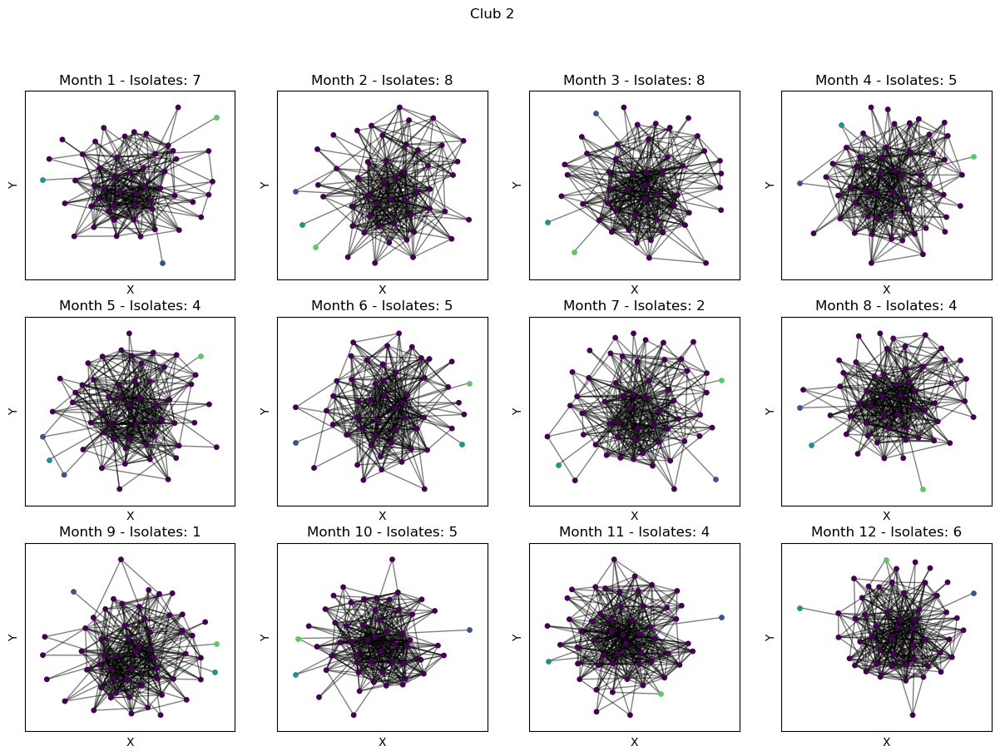

Time elapsed for Club 2: 2.7019190788269043
The graph c3_kudo1 has 8 communities.
The modularity of communities: 0.26454963839579226
The graph c3_kudo2 has 5 communities.
The modularity of communities: 0.3804034977111373
The graph c3_kudo3 has 6 communities.
The modularity of communities: 0.23571374460240901
The graph c3_kudo4 has 8 communities.
The modularity of communities: 0.27130279595478884
The graph c3_kudo5 has 5 communities.
The modularity of communities: 0.3311138775715507
The graph c3_kudo6 has 5 communities.
The modularity of communities: 0.393096119855231
The graph c3_kudo7 has 4 communities.
The modularity of communities: 0.44402203856749317
The graph c3_kudo8 has 4 communities.
The modularity of communities: 0.08152971911290792
The graph c3_kudo9 has 5 communities.
The modularity of communities: 0.36768597119287366
The graph c3_kudo10 has 4 communities.
The modularity of communities: 0.16413634215500936
The graph c3_kudo11 has 5 communities.
The modularity of communities:

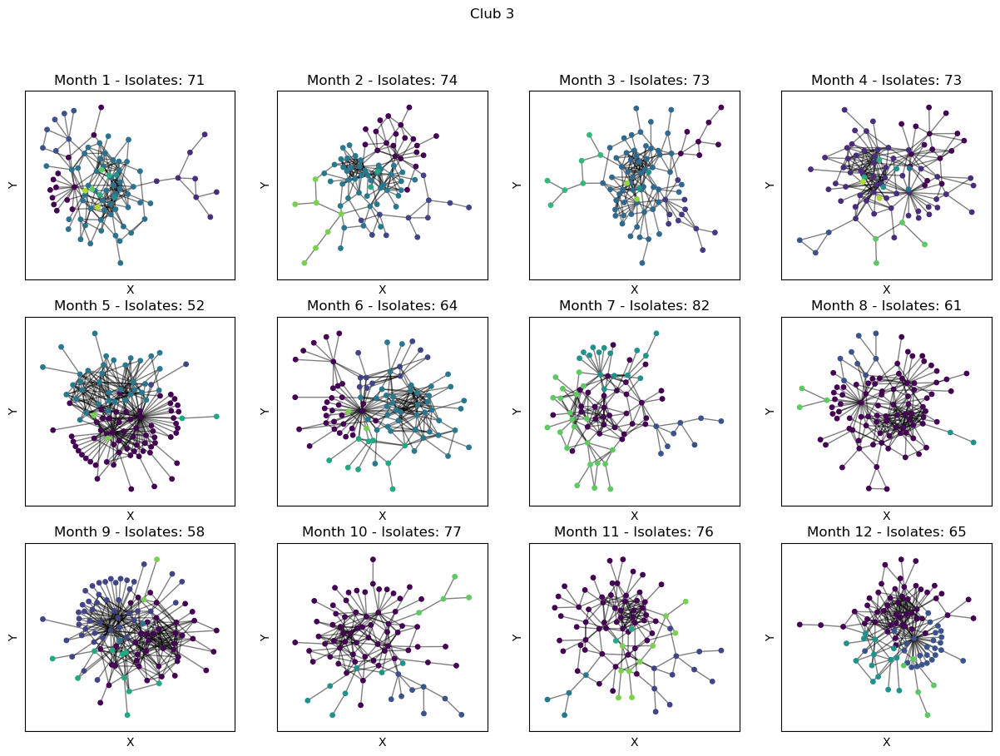

Time elapsed for Club 3: 8.648853063583374
The graph c4_kudo1 has 5 communities.
The modularity of communities: -0.006172839506172839
The graph c4_kudo2 has 5 communities.
The modularity of communities: -0.006172839506172839
The graph c4_kudo3 has 5 communities.
The modularity of communities: 0.10499999999999998
The graph c4_kudo4 has 4 communities.
The modularity of communities: 0.195
The graph c4_kudo5 has 4 communities.
The modularity of communities: 0.195
The graph c4_kudo6 has 4 communities.
The modularity of communities: 0.2355371900826446
The graph c4_kudo7 has 4 communities.
The modularity of communities: 0.14876033057851237
The graph c4_kudo8 has 4 communities.
The modularity of communities: 0.10493827160493825
The graph c4_kudo9 has 4 communities.
The modularity of communities: 0.10493827160493825
The graph c4_kudo10 has 4 communities.
The modularity of communities: 0.14497041420118348
The graph c4_kudo11 has 4 communities.
The modularity of communities: 0.05785123966942146
T

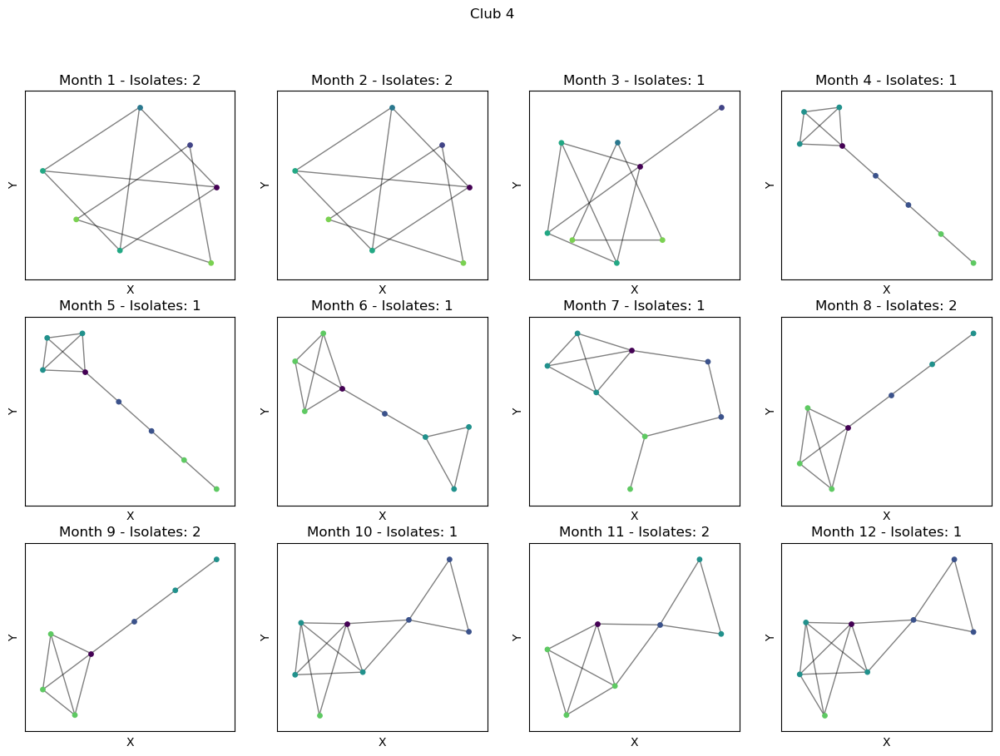

Time elapsed for Club 4: 1.4367923736572266
The graph c5_kudo1 has 6 communities.
The modularity of communities: 0.012586717513895144
The graph c5_kudo2 has 7 communities.
The modularity of communities: 0.02623881916811209
The graph c5_kudo3 has 7 communities.
The modularity of communities: 0.04011824837013919
The graph c5_kudo4 has 7 communities.
The modularity of communities: 0.02362461895775877
The graph c5_kudo5 has 7 communities.
The modularity of communities: 0.01697542533081288
The graph c5_kudo6 has 6 communities.
The modularity of communities: 0.01231548606865234
The graph c5_kudo7 has 6 communities.
The modularity of communities: 0.01127425913750696
The graph c5_kudo8 has 6 communities.
The modularity of communities: 0.010247124565972258
The graph c5_kudo9 has 5 communities.
The modularity of communities: 0.010270860460069507
The graph c5_kudo10 has 5 communities.
The modularity of communities: 0.014444622042256442
The graph c5_kudo11 has 5 communities.
The modularity of comm

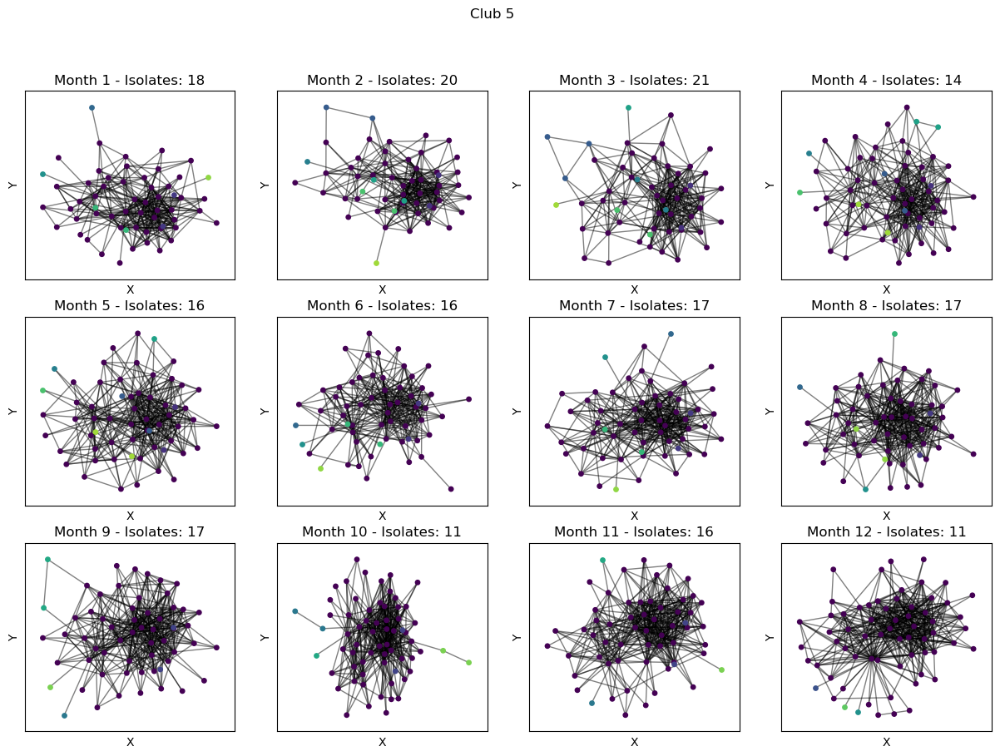

Time elapsed for Club 5: 2.858477830886841


In [71]:
for j in range(1, 6):
    fig, axs = plt.subplots(3, 4, figsize=(15, 10))
    fig.suptitle(f'Club {j}')  
    st = time.time()

    average_modularity_per_month = []

    for i in range(1, 13):
        file_path = os.path.join(folder_path, f'c{j}_kudo{i}.csv')

        df = pd.read_csv(file_path, header=None)
        G = nx.from_pandas_adjacency(df)

        isolates = list(nx.isolates(G))
        G.remove_nodes_from(isolates)

        communities_generator = girvan_newman(G)

        k = 3
        communities = next(communities_generator)
        for _ in range(k - 1):
            communities = next(communities_generator)

        modularity_value = nx_comm.modularity(G, communities)
        average_modularity_per_month.append(modularity_value)

        print(f"The graph c{j}_kudo{i} has {len(communities)} communities.")
        print(f"The modularity of communities: {modularity_value}")

        ax = axs[(i-1)//4, (i-1)%4]
        pos = nx.layout.kamada_kawai_layout(G)

        for idx, community_nodes in enumerate(communities):
            color = cm.viridis(idx / len(communities))
            nx.draw_networkx_nodes(G, pos, nodelist=list(community_nodes), ax=ax, node_size=15, node_color=[color]*len(community_nodes))

        nx.draw_networkx_edges(G, pos, ax=ax, alpha=0.5)

        ax.set_title(f'Month {i} - Isolates: {len(isolates)}')

    average_modularity_for_j = sum(average_modularity_per_month) / len(average_modularity_per_month)
    print(f"Average Modularity for Club {j}: {average_modularity_for_j}")

    for ax in axs.flat:
        ax.set(xlabel='X', ylabel='Y')

    plt.show()

    et = time.time()
    print(f"Time elapsed for Club {j}: {et - st}")



c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\manifold\_spectral_embedding.py:274: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


[2 0 1 2 3 2 2 1 0 2 0 0 0 0 2]
The graph c1_kudo1 has 4 communities.
[1, 16, 18, 19, 20, 21]
[2, 9]
[0, 3, 7, 8, 17, 23]
[6]


c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\manifold\_spectral_embedding.py:274: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


[0 3 1 0 2 0 1 3 2 2 2 3 2 0]
The graph c1_kudo2 has 4 communities.
[0, 3, 7, 23]
[2, 9]
[6, 17, 18, 19, 21]
[1, 16, 20]


c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\manifold\_spectral_embedding.py:274: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


[0 0 1 3 2 0 0 1 1 0 3 0 0 0 0 3 2]
The graph c1_kudo3 has 4 communities.
[0, 1, 7, 8, 16, 18, 19, 20, 21]
[2, 9, 10]
[6, 24]
[3, 17, 23]


c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\manifold\_spectral_embedding.py:274: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


[0 0 1 0 2 3 0 0 1 1 2 0 0 0 0 0 0 0 3]
The graph c1_kudo4 has 4 communities.
[0, 1, 3, 7, 8, 16, 17, 18, 19, 20, 21, 23]
[2, 9, 10]
[5, 13]
[6, 24]


c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\manifold\_spectral_embedding.py:274: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


[0 0 1 3 2 0 0 1 3 0 3 0 0 0 0 3 2]
The graph c1_kudo5 has 4 communities.
[0, 1, 7, 8, 16, 18, 19, 20, 21]
[2, 9]
[6, 24]
[3, 12, 17, 23]


c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\manifold\_spectral_embedding.py:274: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


[2 2 1 0 3 2 2 1 1 0 2 0 2 2 2 2 0 3 2]
The graph c1_kudo6 has 4 communities.
[3, 12, 17, 23]
[2, 9, 10]
[0, 1, 7, 8, 16, 18, 19, 20, 21, 25]
[6, 24]


c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\manifold\_spectral_embedding.py:274: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


[1 1 0 3 2 1 0 3 1 3 3 1 1 1 3 2 1]
The graph c1_kudo7 has 4 communities.
[2, 9]
[0, 1, 7, 16, 19, 20, 21, 25]
[6, 24]
[3, 12, 17, 18, 23]


c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\manifold\_spectral_embedding.py:274: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


[0 0 1 3 2 0 1 3 0 3 0 0 0 0 3 2 3]
The graph c1_kudo8 has 4 communities.
[0, 1, 7, 16, 18, 19, 20, 21]
[2, 9]
[6, 24]
[3, 12, 17, 23, 25]


c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\manifold\_spectral_embedding.py:274: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


[0 0 1 3 0 2 0 0 1 1 3 0 3 0 0 0 0 3 2]
The graph c1_kudo9 has 4 communities.
[0, 1, 4, 7, 8, 16, 18, 19, 20, 21]
[2, 9, 10]
[6, 24]
[3, 12, 17, 23]


c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\manifold\_spectral_embedding.py:274: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


[3 3 1 0 0 2 3 0 1 3 0 0 0 3 0 0 2 3]
The graph c1_kudo10 has 4 communities.
[3, 4, 8, 17, 18, 19, 21, 23]
[2, 9]
[6, 24]
[0, 1, 7, 16, 20, 25]


c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\manifold\_spectral_embedding.py:274: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


[1 1 0 1 1 2 1 0 3 1 1 3 1 1 1 1 3 2 1]
The graph c1_kudo11 has 4 communities.
[2, 9]
[0, 1, 3, 4, 7, 14, 16, 18, 19, 20, 21, 25]
[6, 24]
[12, 17, 23]


c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\manifold\_spectral_embedding.py:274: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


[1 1 2 1 0 0 1 2 3 0 1 0 1 1 1 1 1 1 1 0 0]
The graph c1_kudo12 has 4 communities.
[4, 6, 13, 15, 24, 25]
[0, 1, 3, 7, 14, 16, 17, 18, 19, 20, 21, 23]
[2, 9]
[12]


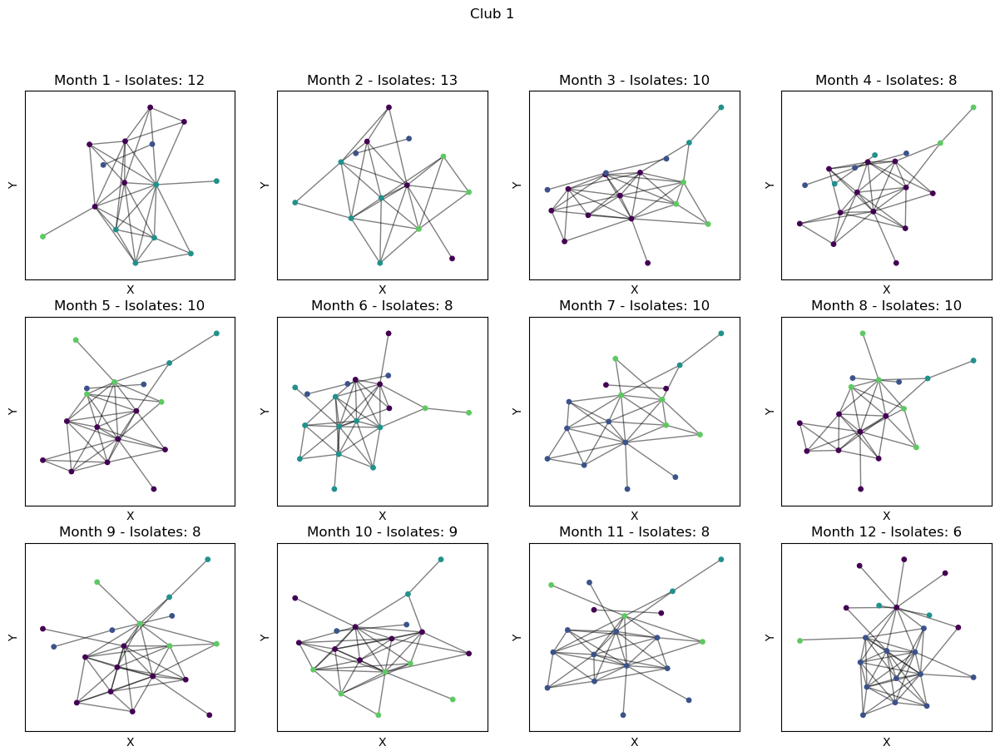

Time elapsed for Club 1: 7.780885934829712 seconds


c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


[0 0 0 0 0 3 0 0 0 0 0 1 0 0 0 0 3 0 0 0 0 0 0 1 0 0 0 0 3 3 0 0 0 2 0 0 0
 3 0 0 0 2 2 1 0 0 0 0 3 0 0]
The graph c2_kudo1 has 4 communities.
[0, 1, 2, 3, 4, 7, 8, 9, 10, 11, 13, 14, 15, 16, 18, 19, 20, 21, 22, 23, 25, 26, 27, 28, 33, 34, 37, 39, 40, 41, 43, 45, 46, 50, 51, 52, 53, 55, 56]
[12, 24, 49]
[38, 47, 48]
[6, 17, 30, 31, 42, 54]


c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


[0 3 2 0 0 1 0 0 0 0 3 2 3 0 3 3 1 0 0 2 0 3 0 2 0 0 0 0 1 1 0 0 0 3 0 0 0
 1 0 0 0 2 2 0 0 0 3 1 0 0]
The graph c2_kudo2 has 4 communities.
[0, 3, 4, 7, 8, 9, 10, 14, 18, 19, 21, 23, 25, 26, 27, 28, 33, 34, 37, 39, 40, 41, 43, 45, 46, 50, 51, 52, 55, 56]
[6, 17, 30, 31, 42, 54]
[2, 12, 20, 24, 47, 49]
[1, 11, 13, 15, 16, 22, 38, 53]


c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


[0 1 1 0 0 1 0 1 0 0 1 3 1 0 1 1 1 0 0 0 0 1 0 3 2 1 0 0 0 1 1 0 0 1 0 0 0
 0 0 0 3 1 3 2 0 0 1 1 0 0]
The graph c2_kudo3 has 4 communities.
[0, 3, 4, 7, 9, 10, 14, 18, 19, 20, 21, 23, 27, 28, 29, 34, 37, 39, 40, 41, 43, 45, 46, 51, 52, 55, 56]
[1, 2, 6, 8, 11, 13, 15, 16, 17, 22, 26, 30, 31, 38, 48, 53, 54]
[25, 50]
[12, 24, 47, 49]


c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


[1 0 0 2 2 0 2 1 2 0 2 0 3 0 2 0 0 2 1 2 1 2 0 2 3 1 1 1 1 2 2 2 2 1 2 0 2
 1 1 2 1 1 3 0 3 1 1 1 1 2 1 1 0]
The graph c2_kudo4 has 4 communities.
[1, 2, 5, 9, 11, 13, 15, 16, 22, 38, 48, 57]
[0, 7, 18, 20, 25, 26, 27, 28, 36, 40, 41, 45, 46, 50, 51, 52, 53, 55, 56]
[3, 4, 6, 8, 10, 14, 17, 19, 21, 23, 30, 31, 33, 34, 37, 39, 43, 54]
[12, 24, 47, 49]


c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


[1 3 0 1 1 3 0 1 1 1 1 3 0 3 1 3 3 0 1 1 3 0 3 1 0 1 1 1 1 2 0 1 0 0 1 3 0
 1 1 1 1 1 1 0 3 0 1 1 1 0 2 1 1 3]
The graph c2_kudo5 has 4 communities.
[2, 6, 12, 17, 21, 24, 31, 34, 36, 39, 47, 49, 53]
[0, 3, 4, 7, 8, 9, 10, 14, 18, 19, 23, 25, 26, 27, 28, 33, 37, 40, 41, 42, 43, 45, 46, 50, 51, 52, 55, 56]
[30, 54]
[1, 5, 11, 13, 15, 16, 20, 22, 38, 48, 57]


c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


[3 1 2 3 3 1 3 3 0 2 0 2 2 2 3 2 2 0 3 3 2 2 1 3 2 3 3 3 3 0 3 2 2 0 2 0 3
 3 0 3 2 3 3 2 2 3 3 3 0 2 3 3 2]
The graph c2_kudo6 has 4 communities.
[8, 10, 17, 30, 37, 39, 42, 53]
[1, 5, 22]
[2, 9, 11, 12, 13, 15, 16, 20, 21, 24, 34, 36, 38, 44, 47, 49, 54, 57]
[0, 3, 4, 6, 7, 14, 18, 19, 23, 25, 26, 27, 28, 33, 40, 41, 43, 45, 46, 50, 51, 52, 55, 56]


c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


[0 2 2 0 0 2 2 2 0 2 0 2 2 2 0 2 2 2 2 2 2 0 2 0 3 0 0 0 0 1 2 2 0 0 0 0 0
 2 0 0 0 0 0 3 0 0 3 2 2 0 0 0 0 1 0 2]
The graph c2_kudo7 has 4 communities.
[0, 3, 4, 8, 10, 14, 21, 23, 25, 26, 27, 28, 33, 34, 35, 36, 37, 39, 40, 41, 42, 43, 45, 46, 50, 51, 52, 53, 55]
[30, 54]
[1, 2, 5, 6, 7, 9, 11, 12, 13, 15, 16, 17, 18, 19, 20, 22, 31, 32, 38, 48, 49, 57]
[24, 44, 47]


c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


[2 0 0 2 2 0 0 0 2 2 2 0 0 0 2 0 0 1 2 2 0 2 0 2 3 2 2 2 2 1 1 0 2 2 2 2 0
 2 2 2 1 2 3 2 2 3 0 0 2 2 2 2 2 2]
The graph c2_kudo8 has 4 communities.
[1, 2, 5, 6, 7, 11, 12, 13, 15, 16, 20, 22, 32, 38, 48, 49]
[17, 30, 31, 42]
[0, 3, 4, 8, 9, 10, 14, 18, 19, 21, 23, 25, 26, 27, 28, 33, 34, 36, 37, 39, 40, 41, 43, 45, 46, 50, 51, 52, 53, 55, 56]
[24, 44, 47]


c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


[1 3 2 1 1 3 1 1 1 1 1 2 2 2 1 2 3 0 1 1 1 2 3 1 2 1 3 1 1 0 0 3 1 1 2 2 1
 1 1 1 1 1 1 2 1 1 2 1 2 1 1 1 1 1 1 1 1]
The graph c2_kudo9 has 4 communities.
[17, 30, 31]
[0, 3, 4, 6, 7, 8, 9, 10, 14, 18, 19, 20, 23, 25, 27, 28, 33, 34, 37, 38, 39, 40, 41, 42, 43, 45, 46, 48, 50, 51, 52, 53, 54, 55, 56, 57]
[2, 11, 12, 13, 15, 21, 24, 35, 36, 44, 47, 49]
[1, 5, 16, 22, 26, 32]


c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


[0 2 1 0 1 2 2 0 0 0 1 2 2 2 1 2 2 3 0 0 0 1 2 0 1 0 0 0 0 3 3 2 1 2 1 0 2
 3 0 0 3 0 1 0 1 1 2 0 0 0 3 0 0]
The graph c2_kudo10 has 4 communities.
[0, 3, 7, 8, 9, 18, 19, 20, 23, 25, 26, 27, 28, 37, 40, 41, 43, 45, 50, 51, 52, 55, 56]
[2, 4, 10, 14, 21, 24, 34, 36, 44, 46, 47]
[1, 5, 6, 11, 12, 13, 15, 16, 22, 32, 35, 38, 49]
[17, 30, 31, 39, 42, 53]


c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


[0 2 3 0 0 2 0 0 0 0 0 2 2 2 0 2 2 0 0 0 2 3 2 0 3 0 0 0 0 1 1 2 3 2 3 0 2
 0 0 0 0 0 3 0 0 3 3 0 0 0 0 1 0 0]
The graph c2_kudo11 has 4 communities.
[0, 3, 4, 6, 7, 8, 9, 10, 14, 17, 18, 19, 23, 25, 26, 27, 28, 37, 39, 40, 41, 42, 43, 45, 46, 50, 51, 52, 53, 55, 56]
[30, 31, 54]
[1, 5, 11, 12, 13, 15, 16, 20, 22, 32, 35, 38]
[2, 21, 24, 34, 36, 44, 47, 49]


c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


[0 2 2 0 0 2 3 0 0 0 0 2 2 0 2 2 3 0 0 2 0 2 0 2 0 0 0 0 3 1 3 0 2 0 0 2 0
 0 0 0 0 2 0 0 2 0 0 0 0 0 0 0]
The graph c2_kudo12 has 4 communities.
[0, 3, 4, 7, 8, 9, 10, 14, 18, 19, 21, 23, 25, 26, 27, 28, 34, 36, 37, 39, 40, 41, 42, 43, 45, 46, 50, 51, 52, 53, 54, 55, 56]
[31]
[1, 2, 5, 12, 13, 15, 16, 20, 22, 24, 35, 38, 44, 47]
[6, 17, 30, 32]


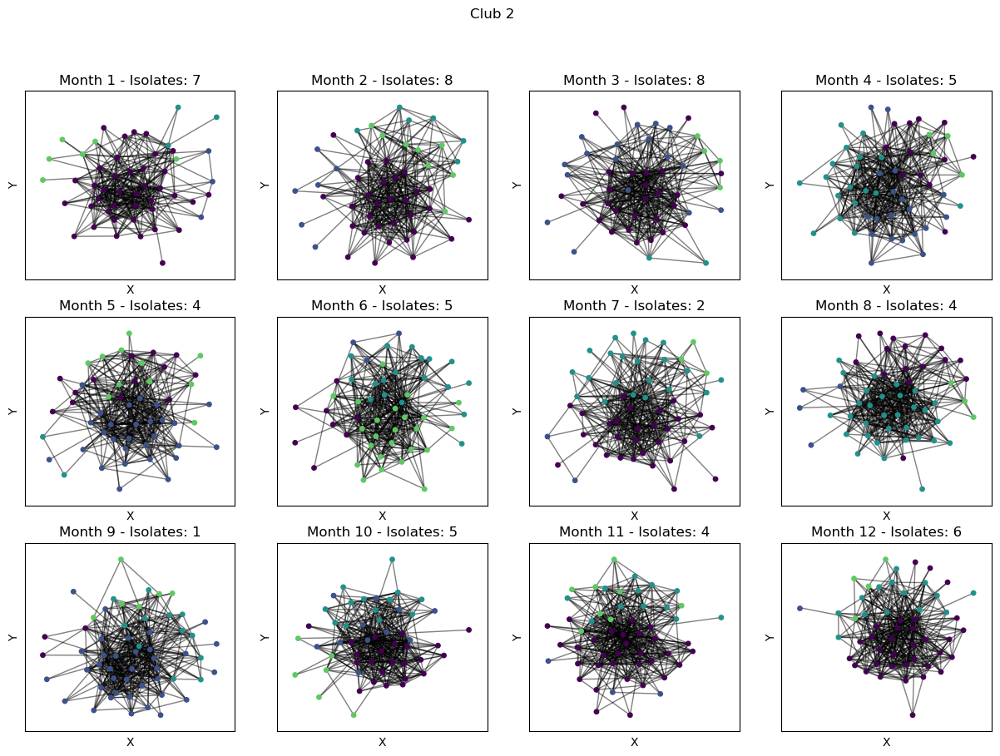

Time elapsed for Club 2: 8.065191984176636 seconds


c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\manifold\_spectral_embedding.py:274: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


[0 0 0 0 0 0 0 0 0 0 0 3 0 0 2 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 2 1 0 0 0 0 0 0 0 0 0 0 0 0 0
 3 0 0 0 0 0 0 0 0 0 0 0 0 0]
The graph c3_kudo1 has 4 communities.
[3, 5, 6, 7, 9, 10, 11, 15, 17, 19, 21, 23, 24, 29, 30, 31, 34, 36, 37, 38, 40, 41, 42, 43, 44, 46, 49, 50, 52, 54, 55, 56, 57, 61, 64, 65, 66, 68, 71, 74, 76, 79, 80, 81, 82, 83, 84, 88, 92, 94, 95, 96, 97, 99, 100, 101, 108, 109, 110, 111, 112, 113, 117, 118, 120, 121, 124, 126, 129, 134, 135, 136, 139, 141, 143, 146, 148, 149, 151, 153, 154, 157]
[85, 105]
[28, 102]
[22, 131]


c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\manifold\_spectral_embedding.py:274: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


[0 3 0 3 0 0 0 0 0 0 0 0 0 0 0 3 0 2 3 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0
 1 0 0 0 3 0 3 0 1 0 0 0 3 0 1 0 1 0 0 0 2 0 1 0 0 3 0 0 0 0 0 3 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 3 3]
The graph c3_kudo2 has 4 communities.
[3, 6, 9, 10, 11, 14, 15, 17, 19, 20, 21, 22, 23, 26, 30, 31, 32, 34, 36, 40, 41, 42, 43, 44, 49, 50, 55, 56, 57, 61, 64, 66, 71, 74, 79, 81, 83, 84, 87, 92, 95, 99, 100, 101, 108, 111, 112, 117, 118, 119, 120, 121, 126, 129, 131, 134, 135, 136, 139, 141, 142, 143, 146, 147, 148, 149]
[46, 65, 82, 94, 97, 110]
[28, 102]
[5, 7, 24, 29, 76, 80, 88, 113, 124, 151, 154]


c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\manifold\_spectral_embedding.py:274: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


[3 1 3 1 1 1 1 1 1 1 1 1 1 3 2 3 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0
 1 1 3 1 1 1 1 1 1 2 3 1 1 0 1 1 0 1 1 2 2 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 0 1 1 1 1 3]
The graph c3_kudo3 has 4 communities.
[65, 94, 97, 110, 146]
[6, 9, 10, 11, 14, 15, 17, 19, 21, 22, 23, 30, 31, 32, 34, 36, 37, 40, 41, 42, 43, 44, 46, 49, 50, 54, 55, 56, 57, 61, 64, 71, 74, 79, 80, 81, 82, 83, 84, 91, 92, 95, 96, 100, 101, 108, 111, 112, 113, 117, 118, 119, 120, 121, 124, 125, 126, 129, 131, 134, 135, 136, 139, 141, 142, 143, 147, 148, 149, 151]
[28, 85, 102, 105]
[5, 7, 24, 29, 76, 88, 154]


c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\manifold\_spectral_embedding.py:274: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


[1 1 1 1 1 1 1 1 1 1 1 2 1 1 1 3 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 3 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 2 1 1 1 1 1 1 1 1 1 1 1]
The graph c3_kudo4 has 4 communities.
[46, 82]
[3, 5, 6, 7, 9, 10, 11, 15, 17, 19, 21, 23, 24, 26, 29, 30, 31, 32, 34, 36, 39, 40, 42, 43, 44, 49, 50, 52, 55, 56, 57, 61, 65, 68, 71, 74, 76, 79, 80, 81, 83, 84, 85, 87, 88, 91, 92, 93, 94, 95, 97, 100, 101, 105, 106, 108, 110, 111, 112, 113, 117, 118, 119, 120, 121, 124, 125, 126, 129, 134, 135, 136, 139, 141, 142, 143, 148, 151, 152, 154]
[22, 131]
[28, 102]


c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\manifold\_spectral_embedding.py:274: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


[0 0 0 0 0 0 3 2 2 3 0 3 0 3 0 0 0 0 2 3 2 0 3 0 0 0 3 0 2 3 3 0 2 2 0 0 2
 3 2 0 3 0 0 0 0 3 0 0 2 2 0 3 0 2 3 1 2 2 0 0 3 0 0 0 0 0 2 0 0 1 0 2 0 0
 2 0 0 3 2 3 2 3 3 0 2 2 0 0 0 3 0 3 0 3 0 2 2 0 0 2 3 0 0 0 0 0 0]
The graph c3_kudo5 has 4 communities.
[3, 5, 6, 7, 8, 9, 18, 22, 24, 26, 28, 29, 33, 36, 37, 39, 41, 46, 52, 54, 58, 62, 64, 65, 68, 72, 73, 79, 82, 88, 89, 93, 94, 95, 96, 97, 101, 102, 106, 110, 111, 113, 115, 125, 130, 131, 133, 135, 137, 140, 143, 146, 151, 152, 153, 154, 156, 157]
[85, 105]
[11, 15, 30, 32, 42, 49, 50, 55, 57, 74, 76, 83, 86, 87, 100, 108, 112, 118, 120, 126, 129, 141, 142, 148]
[10, 17, 19, 23, 31, 34, 40, 43, 44, 56, 61, 71, 81, 84, 92, 117, 119, 121, 124, 134, 136, 139, 149]


c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\manifold\_spectral_embedding.py:274: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


[3 0 0 2 3 2 0 0 0 0 0 0 0 0 2 0 0 0 0 3 0 3 3 0 0 0 0 0 0 2 0 0 0 3 0 0 0
 0 0 0 3 2 2 0 0 2 0 3 0 0 2 0 0 1 2 0 0 0 2 0 0 0 0 1 0 0 0 2 2 0 0 0 0 3
 0 0 0 3 0 0 0 0 3 0 0 0 0 2 2 0 0 0 0 2 3]
The graph c3_kudo6 has 4 communities.
[3, 4, 9, 10, 11, 14, 15, 16, 22, 23, 28, 30, 31, 32, 34, 39, 40, 41, 42, 43, 44, 49, 50, 52, 55, 56, 57, 58, 61, 62, 71, 72, 76, 80, 81, 83, 84, 92, 93, 95, 100, 101, 102, 103, 106, 108, 109, 112, 113, 118, 119, 121, 123, 124, 126, 129, 131, 134, 136, 139, 141, 142, 147, 148, 151, 152]
[85, 105]
[5, 7, 24, 46, 65, 68, 74, 82, 88, 97, 110, 111, 143, 146, 154]
[2, 6, 33, 36, 37, 54, 64, 79, 120, 125, 135, 157]


c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


[0 1 3 1 3 0 0 0 3 0 1 3 1 0 0 3 0 3 3 0 0 0 0 2 0 0 0 3 0 0 0 0 1 3 2 1 0
 2 3 3 0 2 3 0 1 3 0 0 2 0 0 3 3 2 2 0 3 3 0 3 0 0 3 0 0 3 0 3 0 0 0 0 2 0
 3 1 3]
The graph c3_kudo7 has 4 communities.
[3, 10, 11, 15, 23, 30, 31, 34, 40, 42, 43, 44, 49, 50, 51, 55, 56, 57, 61, 71, 81, 84, 92, 95, 100, 101, 112, 119, 121, 124, 126, 129, 134, 136, 139, 141, 142, 148]
[5, 7, 24, 29, 63, 68, 88, 154]
[46, 65, 74, 82, 97, 110, 111, 143]
[6, 9, 22, 28, 32, 36, 37, 54, 64, 79, 80, 83, 91, 102, 108, 113, 118, 120, 125, 131, 135, 151, 157]


c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


[3 3 3 3 3 3 3 0 0 0 3 2 0 0 3 0 1 3 0 0 3 3 0 3 3 3 0 3 0 0 0 0 0 3 0 3 3
 0 0 3 0 3 3 0 3 3 3 0 3 0 3 3 0 0 3 0 3 0 0 0 3 0 1 3 3 0 0 2 3 0 3 0 3 3
 0 0 0 3 0 0 0 3 3 0 3 0 1 0 0 0 2 0 3 3 3 3 3 3]
The graph c3_kudo8 has 4 communities.
[10, 11, 15, 22, 23, 26, 30, 31, 34, 40, 42, 43, 44, 46, 49, 51, 56, 57, 61, 65, 71, 74, 81, 82, 84, 92, 95, 97, 101, 108, 110, 113, 117, 121, 123, 124, 126, 129, 131, 134, 136, 139, 141, 142, 146]
[28, 102, 138]
[19, 111, 143]
[2, 3, 5, 6, 7, 8, 9, 18, 24, 29, 32, 33, 36, 37, 39, 41, 50, 54, 55, 58, 63, 64, 68, 69, 70, 72, 79, 80, 83, 88, 100, 103, 105, 112, 115, 118, 120, 125, 132, 133, 135, 148, 150, 151, 153, 154, 157]


c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\manifold\_spectral_embedding.py:274: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


[2 0 0 0 0 0 2 0 0 1 0 3 0 2 0 2 0 0 0 2 2 0 2 0 0 2 0 0 2 2 3 2 0 0 0 0 2
 2 0 2 0 0 3 0 0 0 0 2 0 0 3 0 0 2 3 2 0 0 2 0 0 0 3 1 0 2 0 0 0 2 3 3 0 0
 0 2 0 2 2 0 0 2 0 0 2 0 2 0 2 0 2 3 0 3 0 0 0 0 0 0 2]
The graph c3_kudo9 has 4 communities.
[3, 5, 6, 7, 9, 11, 12, 15, 22, 24, 28, 29, 30, 33, 36, 39, 41, 42, 50, 51, 54, 55, 58, 62, 64, 66, 68, 69, 70, 72, 73, 79, 80, 88, 89, 93, 95, 96, 100, 102, 103, 108, 112, 113, 118, 120, 124, 125, 129, 133, 135, 138, 141, 145, 147, 148, 150, 151, 152, 154]
[13, 98]
[0, 10, 23, 26, 31, 32, 34, 40, 43, 44, 49, 56, 57, 61, 71, 81, 84, 92, 101, 109, 119, 121, 123, 126, 134, 136, 139, 142, 155]
[19, 46, 65, 74, 82, 97, 110, 111, 143, 146]


c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


[1 3 3 1 1 1 1 1 1 1 1 3 1 3 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 3 2 1
 1 1 1 0 1 3 1 1 0 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 2 1 1 1 1 2 1 1 1 1 1 3 1
 1 1 1 1 2 3 1 1]
The graph c3_kudo10 has 4 communities.
[46, 82, 97, 110]
[0, 9, 10, 11, 15, 19, 21, 22, 23, 28, 30, 31, 32, 33, 34, 40, 41, 43, 44, 49, 50, 51, 55, 56, 57, 59, 61, 64, 65, 71, 74, 79, 81, 84, 92, 95, 100, 101, 102, 103, 108, 111, 112, 117, 118, 119, 120, 121, 123, 124, 126, 129, 131, 134, 136, 139, 141, 142, 143, 146, 147, 148, 149, 151, 155, 158]
[69, 125, 135, 153]
[5, 7, 24, 29, 68, 88, 145, 154]


c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\manifold\_spectral_embedding.py:274: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


[0 2 3 2 0 0 0 1 0 0 0 0 0 2 0 2 0 0 0 0 0 0 0 0 2 0 0 0 0 0 0 0 0 0 2 0 0
 0 0 0 2 0 0 0 0 0 3 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 2 0 3 0 0 3 0 0 0
 0 0 2 0 0 0 2 0 2]
The graph c3_kudo11 has 4 communities.
[0, 9, 10, 11, 17, 19, 21, 22, 23, 28, 30, 31, 34, 40, 41, 43, 44, 46, 49, 50, 51, 55, 56, 57, 59, 61, 65, 69, 70, 71, 74, 76, 79, 80, 81, 82, 84, 92, 93, 95, 97, 100, 101, 102, 108, 110, 111, 112, 113, 117, 118, 119, 120, 121, 124, 126, 134, 136, 139, 141, 142, 143, 148, 149, 151, 155]
[13, 98]
[5, 7, 24, 29, 48, 68, 78, 123, 145, 154, 158]
[6, 91, 125, 135]


c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


[0 0 2 0 0 0 0 0 3 3 0 0 2 0 2 0 0 0 0 0 0 0 0 0 0 3 0 0 0 0 1 0 0 0 0 0 3
 2 0 0 0 3 0 0 0 3 0 0 0 0 0 3 0 0 2 0 0 0 0 3 3 0 0 0 0 0 0 0 0 1 0 2 0 0
 0 0 0 0 0 0 0 0 0 3 3 0 0 0 0 0 2 0 0 0]
The graph c3_kudo12 has 4 communities.
[0, 3, 7, 8, 9, 10, 11, 22, 23, 26, 30, 31, 32, 33, 34, 35, 40, 41, 43, 44, 48, 49, 50, 51, 55, 56, 57, 58, 61, 69, 71, 72, 78, 79, 80, 84, 87, 92, 95, 96, 100, 101, 103, 107, 108, 109, 112, 113, 114, 117, 118, 119, 120, 121, 123, 125, 126, 129, 131, 132, 134, 135, 136, 137, 139, 141, 145, 146, 147, 148, 149, 154, 155, 157]
[53, 122]
[5, 24, 28, 68, 102, 124, 151]
[17, 19, 46, 65, 74, 82, 97, 110, 111, 142, 143]


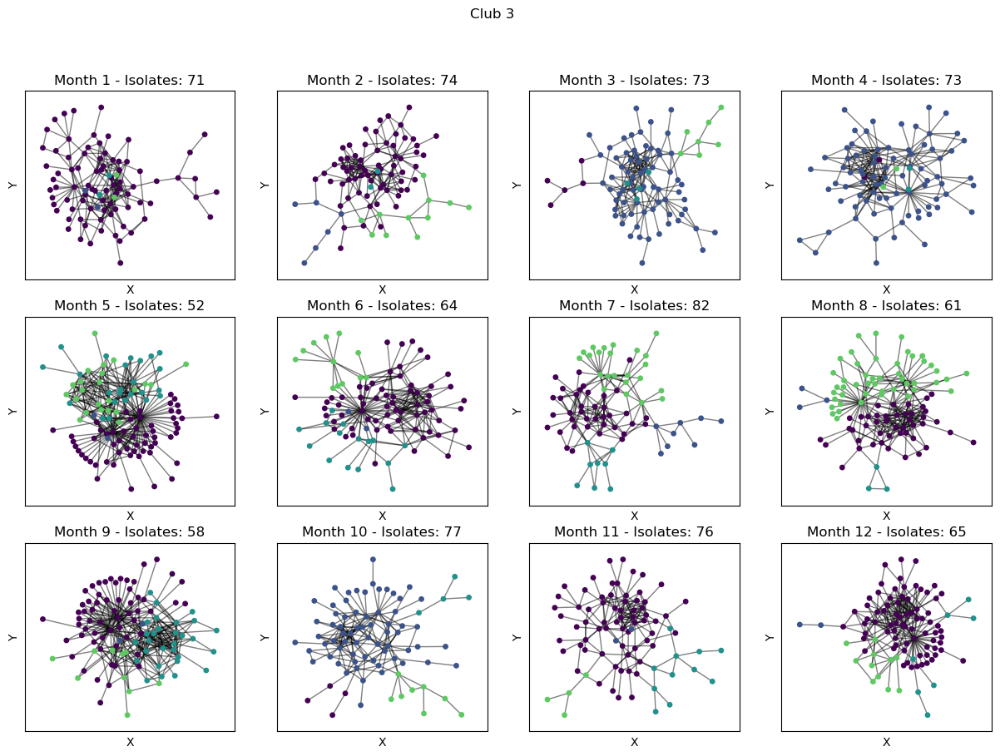

Time elapsed for Club 3: 9.04761815071106 seconds


c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\manifold\_spectral_embedding.py:274: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


[2 0 1 1 0 3 0]
The graph c4_kudo1 has 4 communities.
[2, 6, 8]
[3, 4]
[0]
[7]


c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\manifold\_spectral_embedding.py:274: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


[2 0 1 1 0 3 0]
The graph c4_kudo2 has 4 communities.
[2, 6, 8]
[3, 4]
[0]
[7]


c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\manifold\_spectral_embedding.py:274: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


[0 1 2 3 0 2 0 2]
The graph c4_kudo3 has 4 communities.
[0, 4, 7]
[1]
[2, 6, 8]
[3]


c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


[3 3 2 0 0 1 0 1]
The graph c4_kudo4 has 4 communities.
[3, 4, 7]
[6, 8]
[2]
[0, 1]


c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


[3 3 2 0 0 1 0 1]
The graph c4_kudo5 has 4 communities.
[3, 4, 7]
[6, 8]
[2]
[0, 1]


c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


[3 2 2 0 0 1 0 1]
The graph c4_kudo6 has 4 communities.
[3, 4, 7]
[6, 8]
[1, 2]
[0]


c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


[1 1 0 3 3 2 3 0]
The graph c4_kudo7 has 4 communities.
[2, 8]
[0, 1]
[6]
[3, 4, 7]


c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


[1 1 2 3 0 3 2]
The graph c4_kudo8 has 4 communities.
[4]
[0, 1]
[2, 8]
[3, 7]


c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


[1 1 2 3 3 0 2]
The graph c4_kudo9 has 4 communities.
[7]
[0, 1]
[2, 8]
[3, 4]


c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


[1 1 2 0 0 3 1 2]
The graph c4_kudo10 has 4 communities.
[3, 4]
[0, 1, 7]
[2, 8]
[5]


c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


[3 2 1 0 0 2 1]
The graph c4_kudo11 has 4 communities.
[3, 4]
[2, 8]
[1, 7]
[0]


c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


[1 1 2 0 0 3 0 2]
The graph c4_kudo12 has 4 communities.
[3, 4, 7]
[0, 1]
[2, 8]
[5]


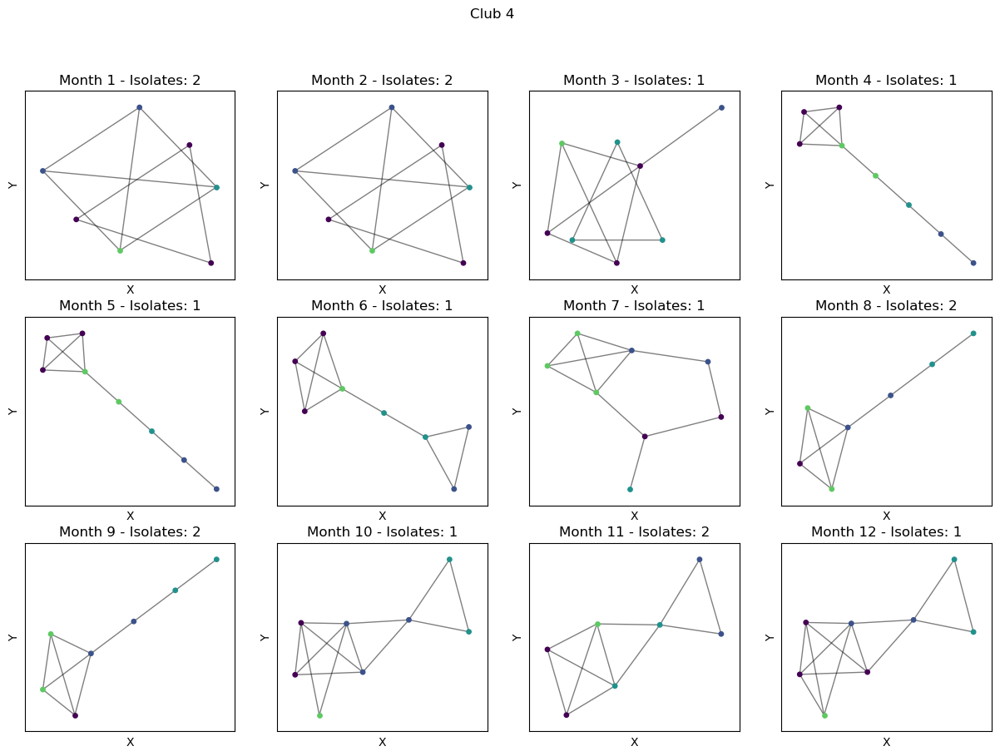

Time elapsed for Club 4: 7.514840841293335 seconds


c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\manifold\_spectral_embedding.py:274: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


[3 1 3 3 3 0 3 0 3 3 3 3 0 0 3 3 3 3 0 0 3 3 0 0 0 3 0 0 3 2 3 3 0 3 0 3 3
 0 0 3 3 0 3 0 2 3 0 3 0 3 3 3 1 3 3 3 0 3]
The graph c5_kudo1 has 4 communities.
[7, 10, 15, 16, 21, 25, 28, 30, 32, 35, 36, 43, 46, 49, 50, 56, 58, 61, 63, 74]
[1, 68]
[38, 59]
[0, 3, 5, 6, 8, 11, 12, 13, 14, 17, 18, 19, 20, 26, 27, 34, 37, 39, 41, 45, 47, 48, 51, 55, 57, 60, 62, 64, 65, 67, 70, 72, 73, 75]


c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\manifold\_spectral_embedding.py:274: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


[0 2 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 3 0 0 0 0 1 0 0 0 0 0 0 0
 0 0 0 0 0 0 1 0 0 0 3 0 0 0 2 0 0 0 0]
The graph c5_kudo2 has 4 communities.
[0, 3, 5, 6, 7, 8, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 25, 26, 27, 28, 30, 34, 35, 36, 37, 39, 41, 43, 45, 46, 47, 48, 49, 50, 51, 56, 57, 58, 60, 61, 62, 64, 65, 67, 70, 72, 73, 75]
[38, 59]
[1, 68]
[31, 63]


c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\manifold\_spectral_embedding.py:274: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


[0 3 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0
 0 0 0 0 0 0 1 0 0 0 0 0 2 3 0 0 0 0]
The graph c5_kudo3 has 4 communities.
[0, 3, 5, 6, 7, 8, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 25, 26, 27, 30, 34, 35, 36, 37, 39, 41, 43, 45, 46, 47, 48, 49, 50, 51, 56, 57, 58, 60, 61, 62, 64, 65, 70, 72, 73, 75]
[38, 59]
[24, 66]
[1, 68]


c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\manifold\_spectral_embedding.py:274: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


[0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 0 0 0 0 0 0 0 0 0 0 0 3 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 3 0 0 0 0 0 2 0 1 0 0 0 0 0 0]
The graph c5_kudo4 has 4 communities.
[0, 3, 5, 6, 7, 8, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 25, 26, 27, 28, 29, 30, 32, 34, 35, 36, 37, 39, 41, 42, 43, 45, 46, 47, 48, 49, 50, 51, 56, 57, 58, 60, 61, 62, 64, 65, 67, 69, 70, 71, 72, 73, 75]
[1, 68]
[24, 66]
[38, 59]


c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\manifold\_spectral_embedding.py:274: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


[0 2 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 3 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 3 0 0 0 0 0 1 2 0 0 0 0 0]
The graph c5_kudo5 has 4 communities.
[0, 3, 5, 6, 7, 8, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 25, 26, 27, 28, 29, 30, 32, 34, 35, 36, 37, 39, 41, 42, 43, 45, 46, 47, 48, 49, 50, 51, 56, 57, 58, 60, 61, 62, 64, 65, 70, 71, 72, 73, 75]
[24, 66]
[1, 68]
[38, 59]


c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\manifold\_spectral_embedding.py:274: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


[0 2 0 0 0 3 0 3 0 0 0 0 3 3 3 0 0 0 3 0 0 3 0 0 3 0 3 3 0 3 3 0 1 0 0 3 3
 0 3 0 0 3 3 0 3 0 3 1 0 3 0 0 0 0 2 0 0 0 0 0]
The graph c5_kudo6 has 4 communities.
[0, 3, 5, 6, 8, 11, 12, 13, 14, 18, 19, 20, 22, 24, 26, 27, 29, 34, 37, 39, 41, 45, 47, 48, 51, 57, 60, 62, 64, 65, 66, 70, 71, 72, 73, 75]
[38, 59]
[1, 68]
[7, 10, 15, 16, 17, 21, 25, 28, 30, 32, 35, 36, 42, 43, 46, 49, 50, 56, 58, 61]


c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\manifold\_spectral_embedding.py:274: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


[3 1 3 3 3 0 3 0 3 3 3 3 0 0 3 3 3 3 0 3 3 0 3 3 3 0 3 0 0 3 2 3 3 0 0 3 0
 3 3 0 0 3 3 0 3 0 2 3 0 3 3 3 3 1 3 3 3 3 3]
The graph c5_kudo7 has 4 communities.
[7, 10, 15, 16, 21, 25, 30, 35, 36, 42, 43, 46, 49, 50, 56, 58, 61]
[1, 68]
[38, 59]
[0, 3, 5, 6, 8, 11, 12, 13, 14, 17, 18, 19, 20, 22, 24, 26, 27, 29, 34, 37, 39, 41, 45, 47, 48, 51, 54, 57, 60, 62, 64, 65, 66, 69, 70, 71, 72, 75]


c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\manifold\_spectral_embedding.py:274: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


[3 2 3 3 3 0 3 3 3 3 3 0 0 3 3 3 3 0 3 3 0 3 3 0 0 3 0 0 3 1 3 3 0 0 3 0 3
 3 0 0 3 3 0 3 0 1 3 0 3 3 3 3 3 2 3 3 3 3 3]
The graph c5_kudo8 has 4 communities.
[7, 15, 16, 21, 25, 28, 30, 35, 36, 42, 43, 46, 49, 50, 56, 58, 61]
[38, 59]
[1, 68]
[0, 3, 5, 6, 8, 11, 12, 13, 14, 17, 18, 19, 20, 22, 24, 26, 27, 34, 37, 39, 41, 45, 47, 48, 51, 54, 57, 60, 62, 64, 65, 66, 67, 69, 70, 71, 72, 75]


c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\manifold\_spectral_embedding.py:274: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


[0 1 0 3 0 3 0 2 0 0 0 0 3 3 0 0 0 0 3 0 0 3 0 0 2 3 0 3 3 0 0 0 3 3 0 3 0
 0 3 3 0 0 3 3 0 3 0 3 0 0 0 0 1 0 0 0 0 0 0]
The graph c5_kudo9 has 4 communities.
[0, 3, 5, 8, 11, 12, 13, 14, 17, 18, 19, 20, 22, 24, 26, 27, 34, 37, 39, 41, 45, 47, 48, 51, 54, 57, 60, 62, 64, 65, 66, 69, 70, 71, 72, 73, 75]
[1, 68]
[10, 28]
[4, 7, 15, 16, 21, 25, 30, 35, 36, 42, 43, 46, 49, 50, 55, 56, 58, 61]


c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\manifold\_spectral_embedding.py:274: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


[0 1 2 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 3 0 0 0
 0 0 2 0 0 0 0 0 0 0 0 0 0 0 3 0 0 0 0 0 0 1 0 0 0 0 0 0]
The graph c5_kudo10 has 4 communities.
[0, 3, 4, 5, 7, 8, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 24, 25, 26, 27, 28, 29, 30, 32, 34, 35, 36, 37, 39, 40, 41, 42, 43, 45, 46, 47, 48, 49, 50, 51, 54, 56, 57, 58, 60, 61, 62, 64, 65, 66, 69, 70, 71, 72, 73, 75]
[1, 68]
[2, 44]
[38, 59]


c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\manifold\_spectral_embedding.py:274: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


[2 1 0 2 3 2 2 0 2 2 2 2 2 0 0 0 2 2 2 3 2 3 2 2 0 2 3 3 2 3 3 0 2 3 2 3 3
 2 3 2 2 3 3 2 3 3 2 0 2 3 2 2 2 2 1 2 2 2 0 2]
The graph c5_kudo11 has 4 communities.
[2, 7, 15, 16, 17, 28, 37, 58, 73]
[1, 68]
[0, 3, 5, 6, 8, 11, 12, 13, 14, 18, 19, 20, 22, 26, 27, 29, 34, 39, 41, 45, 47, 48, 51, 57, 60, 62, 64, 65, 66, 70, 71, 72, 75]
[4, 21, 25, 30, 32, 35, 36, 40, 42, 43, 46, 49, 50, 54, 56, 61]


c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


[0 1 3 0 0 0 0 2 0 2 0 0 0 0 3 3 3 0 0 0 3 0 3 0 0 2 0 3 3 3 0 3 3 0 3 0 3
 0 3 3 0 3 0 0 3 3 0 3 3 0 3 0 3 0 0 0 0 1 0 0 0 0 0 3 0]
The graph c5_kudo12 has 4 communities.
[0, 3, 4, 5, 6, 8, 11, 12, 13, 14, 18, 19, 20, 22, 26, 27, 29, 34, 37, 39, 41, 45, 47, 48, 51, 57, 60, 62, 64, 65, 66, 69, 70, 71, 72, 73, 75]
[1, 68]
[7, 10, 28]
[2, 15, 16, 17, 21, 25, 30, 32, 33, 35, 36, 38, 40, 42, 43, 46, 49, 50, 55, 56, 58, 61, 74]


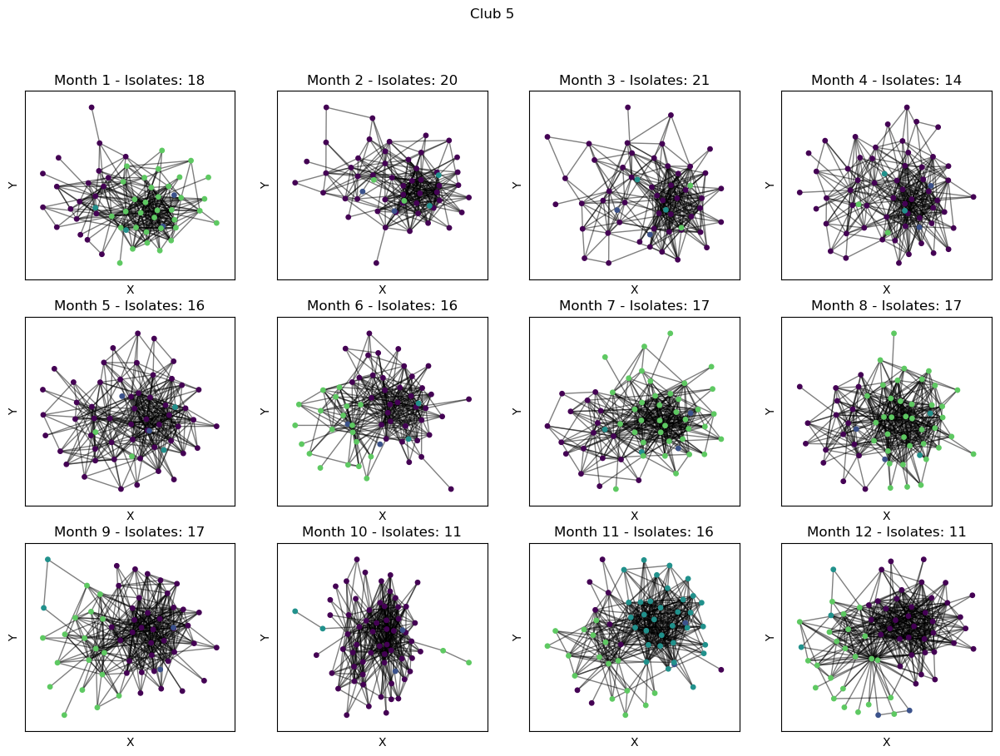

Time elapsed for Club 5: 8.23103642463684 seconds


In [62]:
for j in range(1, 6):
    fig, axs = plt.subplots(3, 4, figsize=(15, 10))
    fig.suptitle(f'Club {j}') 
    st = time.time()

    for i in range(1, 13):
        file_path = os.path.join(folder_path, f'c{j}_kudo{i}.csv')

        df = pd.read_csv(file_path, header=None)
        G = nx.from_pandas_adjacency(df)

        isolates = list(nx.isolates(G))
        G.remove_nodes_from(isolates)

        adjacency_matrix = nx.to_numpy_array(G)

        communities = spectral_clustering(adjacency_matrix, n_clusters=4, random_state=42)

        print(communities)
        print(f"The graph c{j}_kudo{i} has {len(set(communities))} communities.")
        et = time.time()

        ax = axs[(i-1)//4, (i-1)%4]
        pos = nx.layout.kamada_kawai_layout(G)
        
        for idx, community in enumerate(set(communities)):
            color = plt.cm.viridis(idx / len(set(communities))) 
            nodes_in_community = [node for node, label in zip(G.nodes, communities) if label == community]
            nx.draw_networkx_nodes(G, pos, nodelist=nodes_in_community, ax=ax, node_size=15, node_color=[color]*len(nodes_in_community))

            print(f"{nodes_in_community}")
        
        nx.draw_networkx_edges(G, pos, ax=ax, alpha=0.5)
        
        ax.set_title(f'Month {i} - Isolates: {len(isolates)}')

    for ax in axs.flat:
        ax.set(xlabel='X', ylabel='Y')

    plt.show()

    et = time.time()
    print(f"Time elapsed for Club {j}: {et - st} seconds")


c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\manifold\_spectral_embedding.py:274: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(
c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
c:\Users\Katerina\Anaconda3\envs\python_projects\lib\site-packages\sklearn\manifold\_spectral_embedding.py:274: UserWarning: Graph is not fully connected, spec

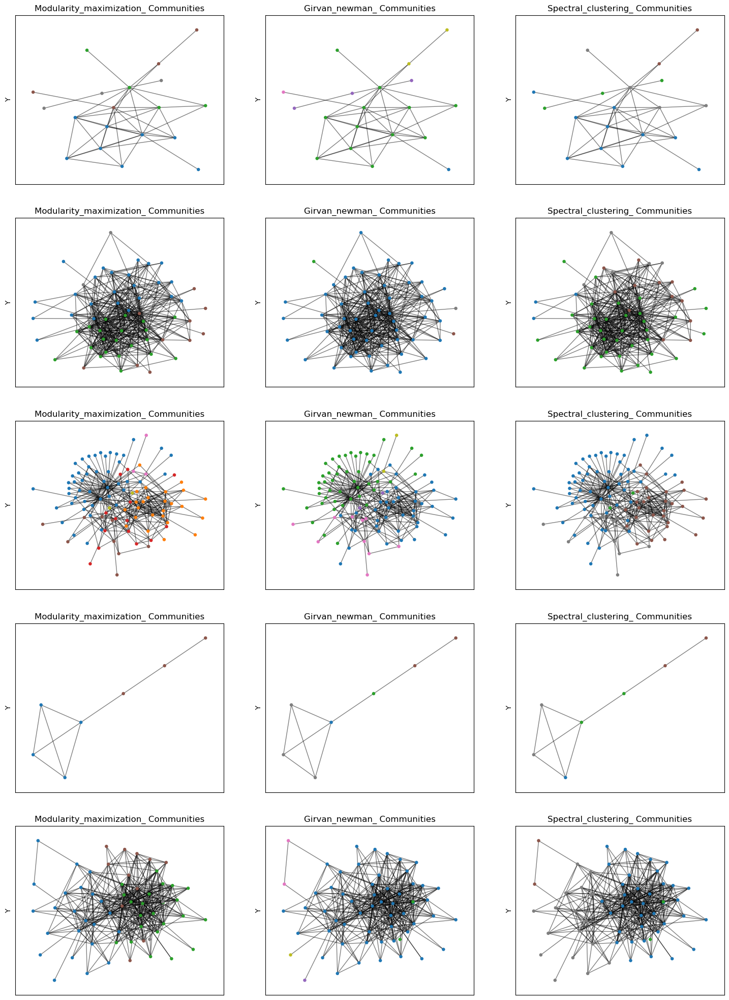

In [6]:
def load_graph(file_path):
    df = pd.read_csv(file_path, header=None)
    G = nx.from_pandas_adjacency(df)
    return G

def remove_isolates(G):
    isolates = list(nx.isolates(G))
    G.remove_nodes_from(isolates)
    return G, isolates

def plot_communities(G, communities, ax, pos, algorithm_name):
    for idx, community_nodes in enumerate(communities):
        color = plt.cm.tab10(idx / len(communities))
        nx.draw_networkx_nodes(G, pos, nodelist=list(community_nodes), ax=ax, edgecolors='none', node_size=22, node_color=[color]*len(community_nodes))
    nx.draw_networkx_edges(G, pos, ax=ax, alpha=0.5)
    ax.set_title(f'{algorithm_name} Communities')

def analyze_and_plot(folder_path, club_num, method, ax):
    file_path = os.path.join(folder_path, f'c{club_num}_kudo9.csv')

    G = load_graph(file_path)
    G, isolates = remove_isolates(G)

    if method == 'modularity_maximization_':
        communities = list(greedy_modularity_communities(G))
    elif method == 'girvan_newman_':
        communities_generator = girvan_newman(G)
        k = 3 
        communities = next(communities_generator)
        for _ in range(k - 1):
            communities = next(communities_generator)
    elif method == 'spectral_clustering_':
        adjacency_matrix = nx.to_numpy_array(G)
        labels = spectral_clustering(adjacency_matrix, n_clusters=4, random_state=42)
        communities = [set(node for i, node in enumerate(G.nodes()) if labels[i] == label) for label in set(labels)]

    pos = nx.kamada_kawai_layout(G)
    plot_communities(G, communities, ax, pos, method.capitalize())

if __name__ == "__main__":
    folder_path = 'C:/Users/Katerina/Desktop/thesis/kudo_notnull/'
    fig, axs = plt.subplots(5, 3, figsize=(18, 25))

    for club_num in range(1, 6):

        analyze_and_plot(folder_path, club_num, 'modularity_maximization_', axs[club_num-1, 0])
        analyze_and_plot(folder_path, club_num, 'girvan_newman_', axs[club_num-1, 1])
        analyze_and_plot(folder_path, club_num, 'spectral_clustering_', axs[club_num-1, 2])

        axs[club_num-1, 0].set(ylabel='Y')
        axs[club_num-1, 1].set(ylabel='Y')
        axs[club_num-1, 2].set(ylabel='Y')

    plt.show()
